# 1. Setup

In [9]:
# Setup imports

import os
import glob
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans
from clustering_algorithms.clusterer import get_clusterer

from utils.fingerprint_transformer import FingerprintTransformer, smiles_to_fingerprints
from utils import create_tsne, create_umap

%matplotlib inline

sns.set_theme(style="whitegrid")


# 2. Load Data

In [10]:
data_dir = "data/cleaned_data"
dataset_files = sorted(glob.glob(os.path.join(data_dir, "*.csv")))

print(f"Found {len(dataset_files)} datasets")

def load_smiles_and_labels(csv_path):
    df = pd.read_csv(csv_path).dropna(subset=["Smiles", "Standard Value"])
    smiles = df["Smiles"].tolist()
    labels = df["Standard Value"].astype(float).tolist()
    return smiles, labels


Found 10 datasets


# 3. Clustering

In [11]:
def run_clustering(
    smiles_list,
    clusterer_names=None,
    n_clusters=5,
    fp_type="morgan",
    random_state=42,
    neighbor_k=5,
    min_shared=3
):
    if clusterer_names is None:
        clusterer_names = [
            "scaffold",
            "jarvis-patrick",
            "kmedoids",
            "maxmin",
            "butina",
            "birch"
        ]

    results = {}
    for name in clusterer_names:
        print(f"Running clustering: {name}")
        pipeline = get_clusterer(
            name=name,
            n_clusters=n_clusters,
            random_state=random_state,
            fp_type=fp_type,
            neighbor_k=neighbor_k,
            min_shared=min_shared
        )
        try:
            if hasattr(pipeline, "fit_predict"):
                labels = pipeline.fit_predict(smiles_list)
            else:
                pipeline.fit(smiles_list)
                if hasattr(pipeline, "predict"):
                    labels = pipeline.predict(smiles_list)
                else:
                    labels = pipeline.named_steps["clusterer"].get_labels()
            results[name] = labels
        except Exception as e:
            print(f"Failed clustering {name}: {e}")
            results[name] = None
    return results


from sklearn.metrics import (
    silhouette_score,
    adjusted_rand_score,
    mutual_info_score,
    normalized_mutual_info_score,
    homogeneity_score,
    completeness_score,
    v_measure_score
)
import pandas as pd
import numpy as np

def evaluate_clustering(csv_path, predicted_labels, metric, feature_matrix=None):
    df = pd.read_csv(csv_path)
    if "Standard Value" not in df.columns:
        raise ValueError("CSV must contain 'Standard Value' column for evaluation.")

    true_labels = df["Standard Value"].astype(float).values

    mask = ~np.isnan(true_labels)
    true_labels = true_labels[mask]
    predicted_labels = np.array(predicted_labels)[mask]

    if feature_matrix is not None:
        feature_matrix = np.array(feature_matrix)[mask]

    if metric == "silhouette_score":
        if feature_matrix is None:
            raise ValueError("feature_matrix is required for silhouette_score.")
        if len(set(predicted_labels)) < 2:
            return float("nan")  # Silhouette undefined for single cluster
        return silhouette_score(feature_matrix, predicted_labels)
    elif metric == "adjusted_rand_score":
        return adjusted_rand_score(true_labels, predicted_labels)
    elif metric == "mutual_info_score":
        return mutual_info_score(true_labels, predicted_labels)
    elif metric == "normalized_mutual_info_score":
        return normalized_mutual_info_score(true_labels, predicted_labels)
    elif metric == "homogeneity_score":
        return homogeneity_score(true_labels, predicted_labels)
    elif metric == "completeness_score":
        return completeness_score(true_labels, predicted_labels)
    elif metric == "v_measure_score":
        return v_measure_score(true_labels, predicted_labels)
    else:
        raise ValueError(f"Unsupported metric: {metric}")



# 4. Run Clustering


=== Processing dataset: data/cleaned_data/5-HT1A.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:329: UserWarning: Cluster 4 is empty! self.labels_[self.medoid_indices_[4]] may not be labeled with its corresponding cluster (4).
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:297: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(


Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.1431
adjusted_rand_score: 0.0244
mutual_info_score: 5.4058
normalized_mutual_info_score: 0.7787
homogeneity_score: 0.7692
completeness_score: 0.7884
v_measure_score: 0.7787


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.1431
t-SNE plot saved to TSNE_plots/tsne_5-HT1A_scaffold.png


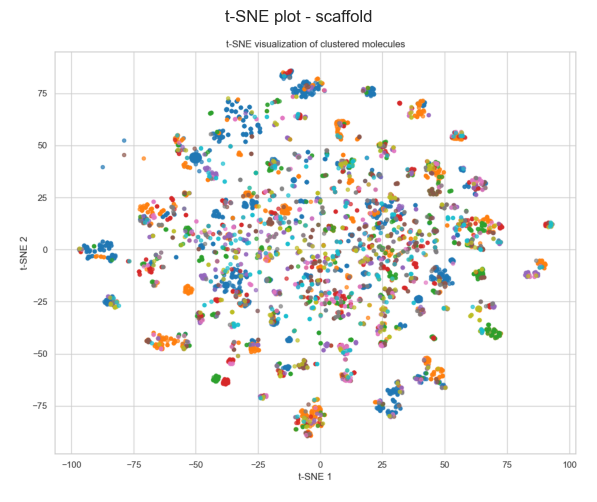

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_5-HT1A_scaffold.png


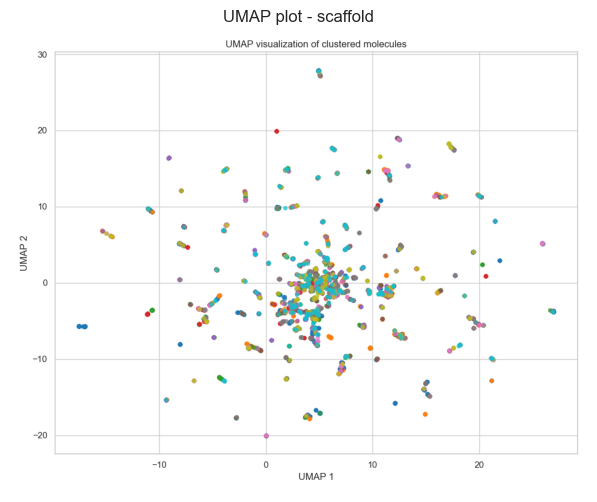


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2269
adjusted_rand_score: 0.0183
mutual_info_score: 6.3405
normalized_mutual_info_score: 0.8499
homogeneity_score: 0.9023
completeness_score: 0.8034
v_measure_score: 0.8499


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.2269
t-SNE plot saved to TSNE_plots/tsne_5-HT1A_jarvis-patrick.png


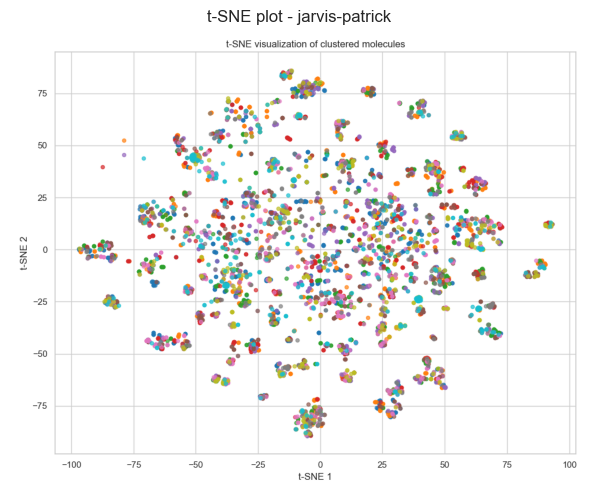

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_5-HT1A_jarvis-patrick.png


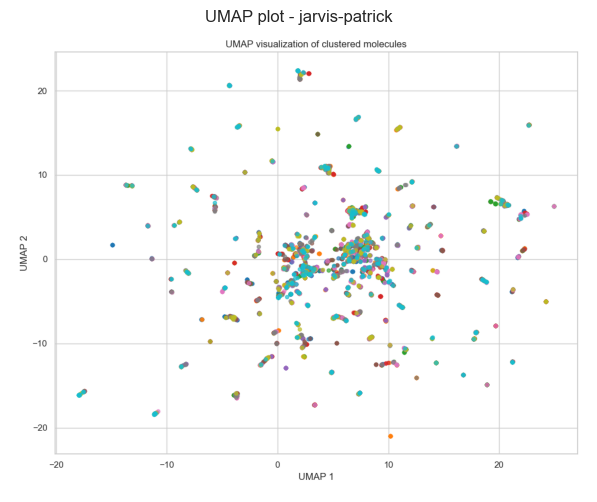


Evaluating clustering with algorithm: kmedoids
silhouette_score: -0.1062
adjusted_rand_score: 0.0005
mutual_info_score: 0.5084
normalized_mutual_info_score: 0.1252
homogeneity_score: 0.0723
completeness_score: 0.4637
v_measure_score: 0.1252


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: -0.1062
t-SNE plot saved to TSNE_plots/tsne_5-HT1A_kmedoids.png


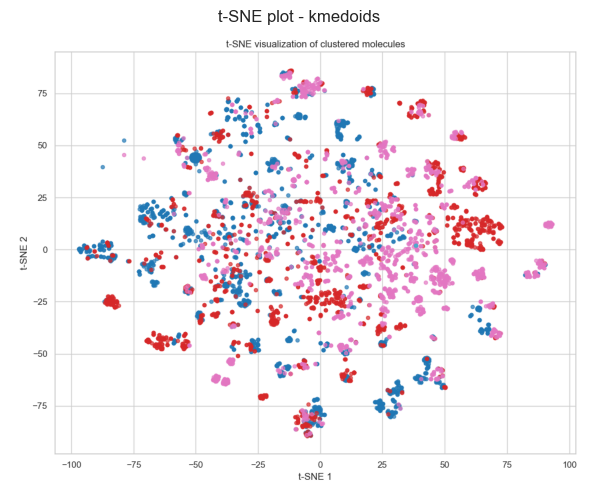

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_5-HT1A_kmedoids.png


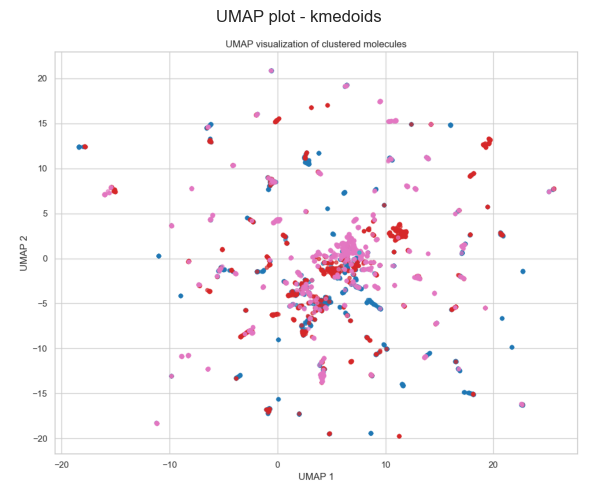


Evaluating clustering with algorithm: maxmin
silhouette_score: -0.0119
adjusted_rand_score: 0.0000
mutual_info_score: 0.5304
normalized_mutual_info_score: 0.1303
homogeneity_score: 0.0755
completeness_score: 0.4764
v_measure_score: 0.1303


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: -0.0119
t-SNE plot saved to TSNE_plots/tsne_5-HT1A_maxmin.png


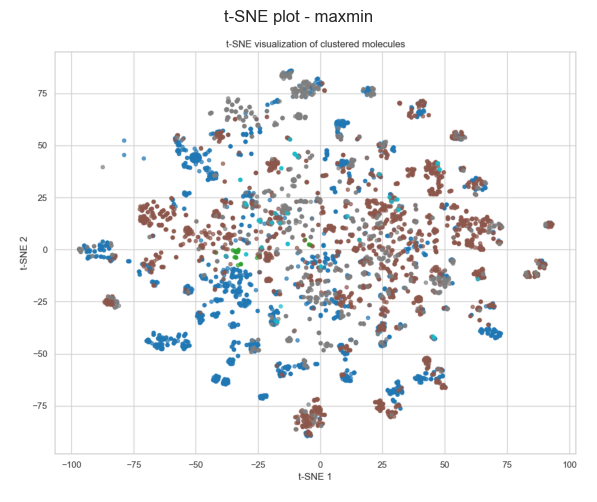

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_5-HT1A_maxmin.png


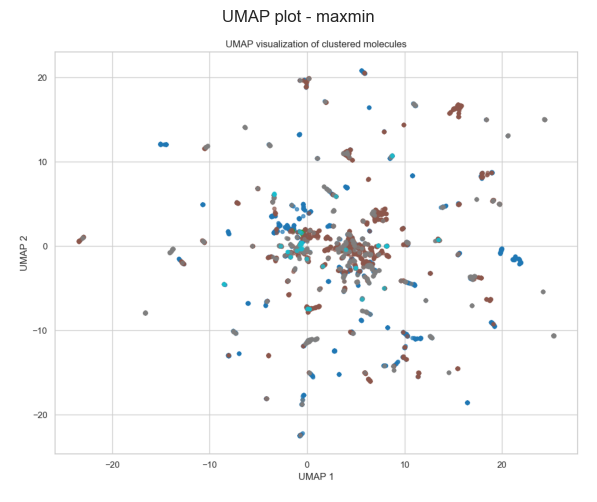


Evaluating clustering with algorithm: butina
silhouette_score: 0.2699
adjusted_rand_score: 0.0323
mutual_info_score: 5.2237
normalized_mutual_info_score: 0.7636
homogeneity_score: 0.7433
completeness_score: 0.7851
v_measure_score: 0.7636


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.2699
t-SNE plot saved to TSNE_plots/tsne_5-HT1A_butina.png


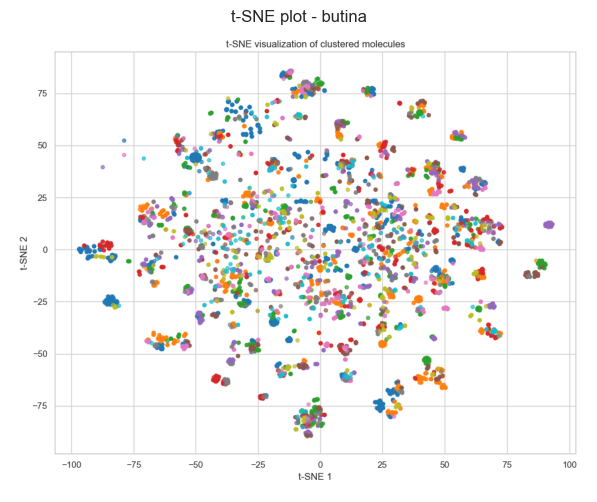

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_5-HT1A_butina.png


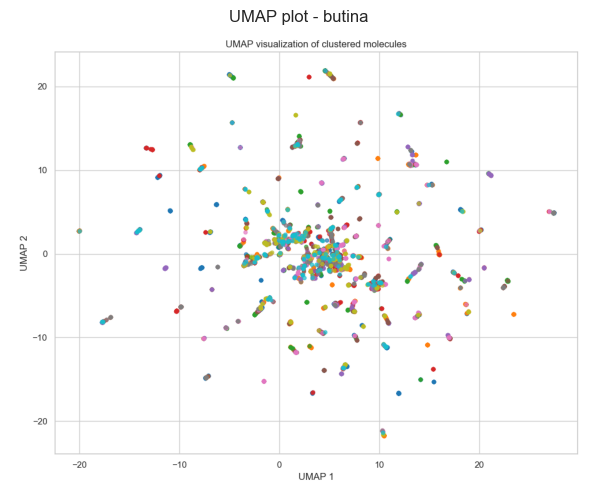


Evaluating clustering with algorithm: birch
silhouette_score: 0.0535
adjusted_rand_score: 0.0019
mutual_info_score: 0.6993
normalized_mutual_info_score: 0.1689
homogeneity_score: 0.0995
completeness_score: 0.5587
v_measure_score: 0.1689


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.0535
t-SNE plot saved to TSNE_plots/tsne_5-HT1A_birch.png


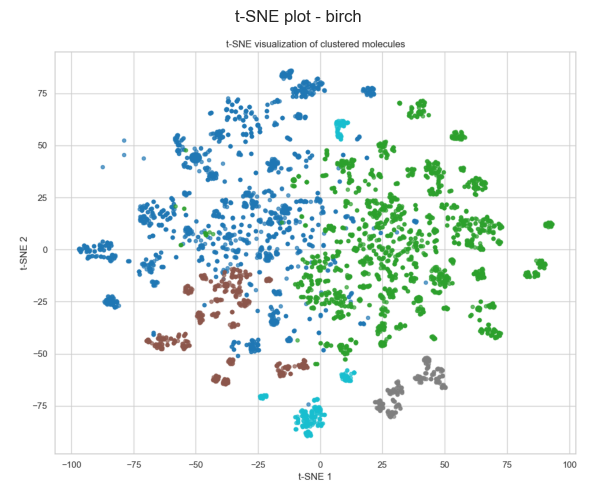

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_5-HT1A_birch.png


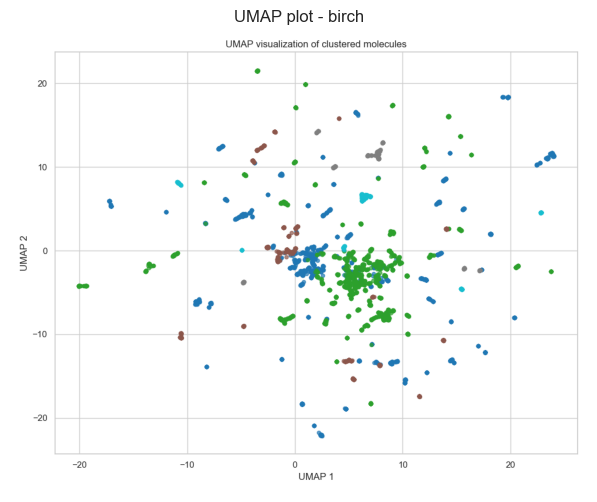


=== Processing dataset: data/cleaned_data/5-HT1B.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:297: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(


Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.1010
adjusted_rand_score: 0.0282
mutual_info_score: 4.1750
normalized_mutual_info_score: 0.7599
homogeneity_score: 0.7729
completeness_score: 0.7474
v_measure_score: 0.7599


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.1010
t-SNE plot saved to TSNE_plots/tsne_5-HT1B_scaffold.png


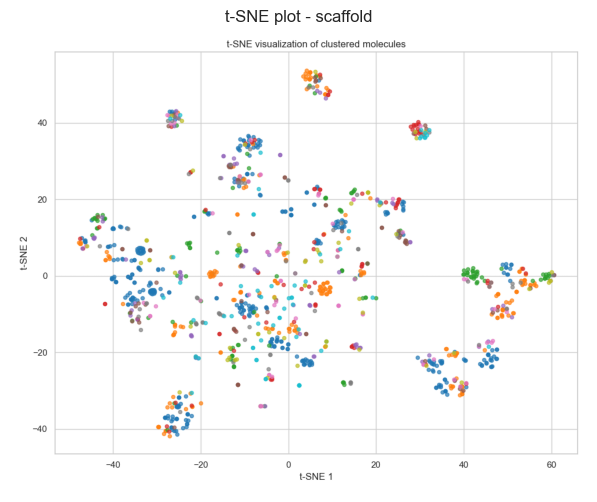

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_5-HT1B_scaffold.png


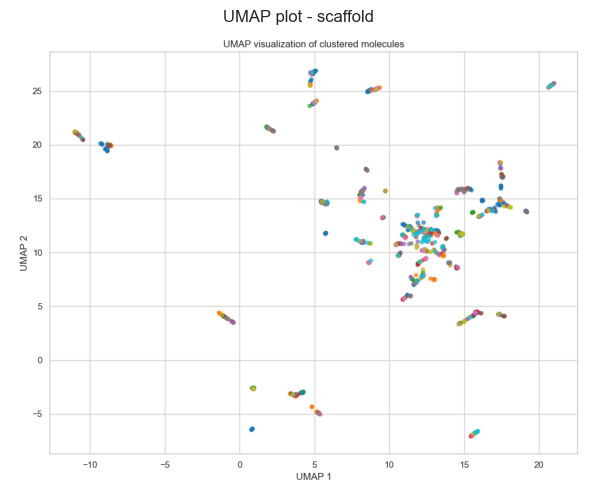


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.1984
adjusted_rand_score: 0.0208
mutual_info_score: 4.7331
normalized_mutual_info_score: 0.8113
homogeneity_score: 0.8762
completeness_score: 0.7554
v_measure_score: 0.8113
silhouette_score: 0.1984


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

t-SNE plot saved to TSNE_plots/tsne_5-HT1B_jarvis-patrick.png


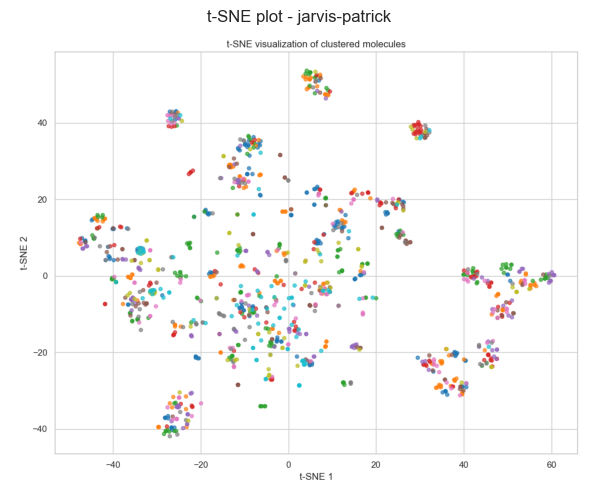

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_5-HT1B_jarvis-patrick.png


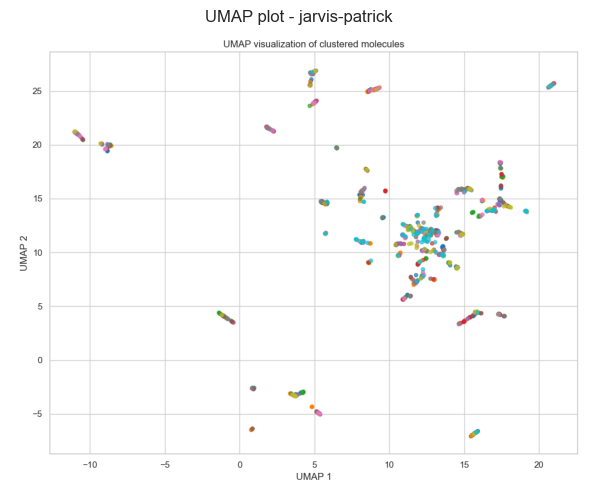


Evaluating clustering with algorithm: kmedoids
silhouette_score: 0.0372
adjusted_rand_score: 0.0077
mutual_info_score: 0.9053
normalized_mutual_info_score: 0.2597
homogeneity_score: 0.1676
completeness_score: 0.5768
v_measure_score: 0.2597
silhouette_score: 0.0372


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

t-SNE plot saved to TSNE_plots/tsne_5-HT1B_kmedoids.png


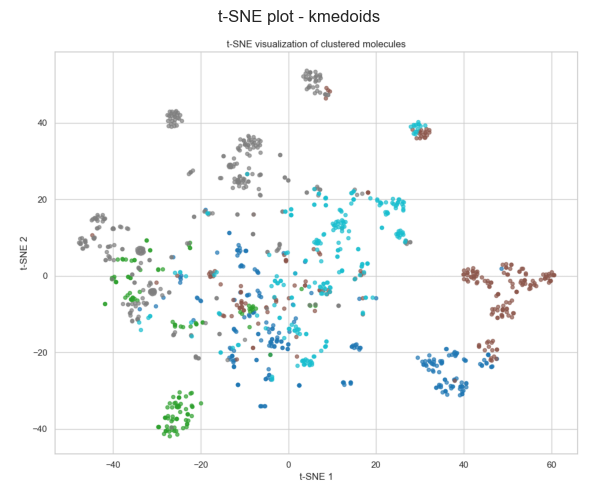

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_5-HT1B_kmedoids.png


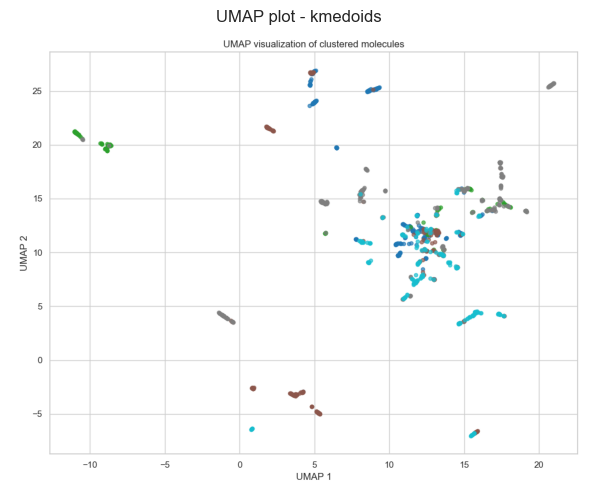


Evaluating clustering with algorithm: maxmin
silhouette_score: 0.0138
adjusted_rand_score: -0.0060
mutual_info_score: 0.6460
normalized_mutual_info_score: 0.1962
homogeneity_score: 0.1196
completeness_score: 0.5456
v_measure_score: 0.1962
silhouette_score: 0.0138


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

t-SNE plot saved to TSNE_plots/tsne_5-HT1B_maxmin.png


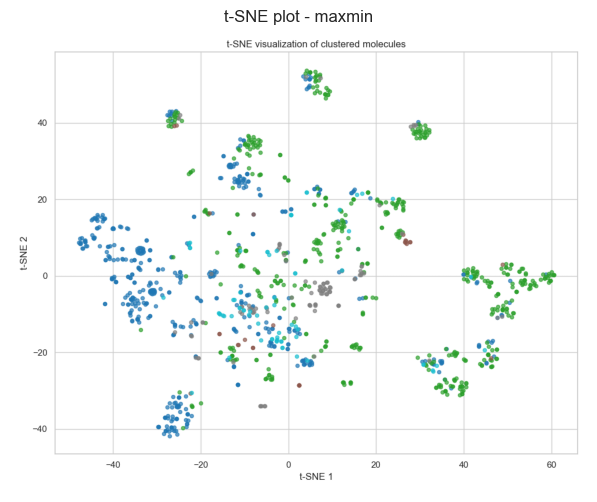

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_5-HT1B_maxmin.png


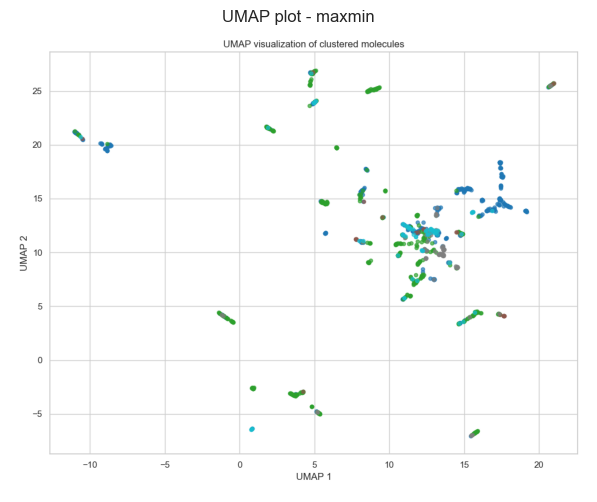


Evaluating clustering with algorithm: butina
silhouette_score: 0.2496
adjusted_rand_score: 0.0392
mutual_info_score: 3.9866
normalized_mutual_info_score: 0.7414
homogeneity_score: 0.7380
completeness_score: 0.7448
v_measure_score: 0.7414
silhouette_score: 0.2496


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

t-SNE plot saved to TSNE_plots/tsne_5-HT1B_butina.png


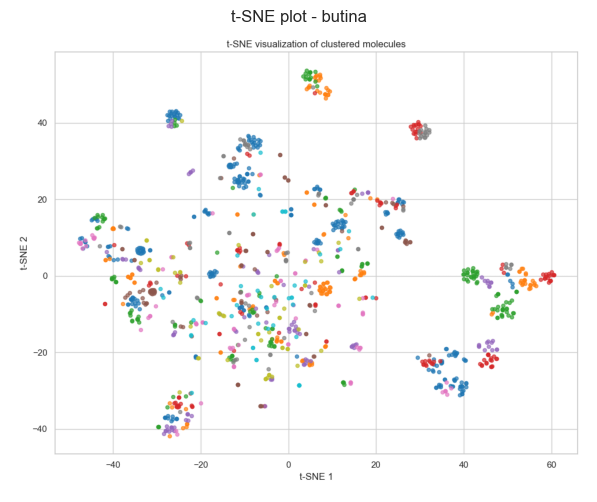

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_5-HT1B_butina.png


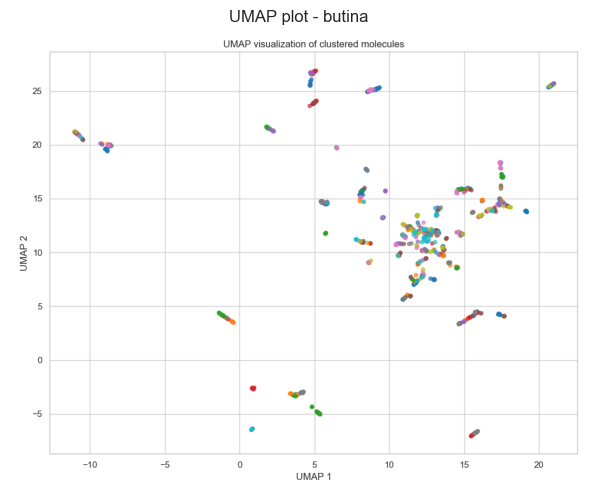


Evaluating clustering with algorithm: birch
silhouette_score: 0.0893
adjusted_rand_score: 0.0479
mutual_info_score: 0.8933
normalized_mutual_info_score: 0.2682
homogeneity_score: 0.1654
completeness_score: 0.7093
v_measure_score: 0.2682


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.0893
t-SNE plot saved to TSNE_plots/tsne_5-HT1B_birch.png


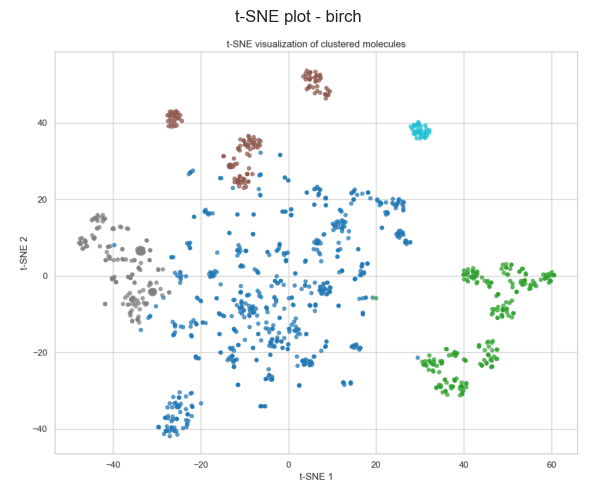

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_5-HT1B_birch.png


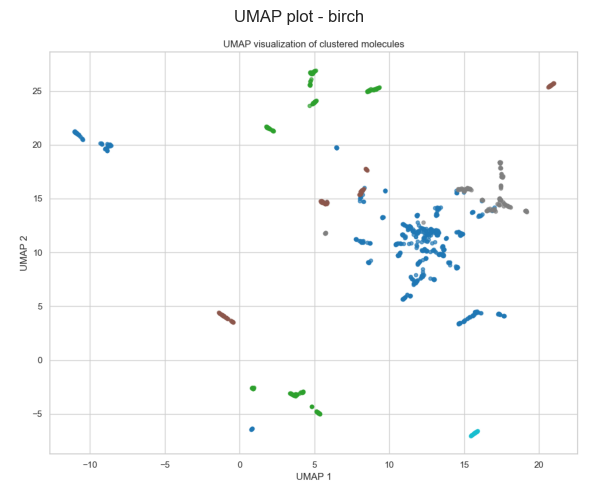


=== Processing dataset: data/cleaned_data/D1.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:329: UserWarning: Cluster 2 is empty! self.labels_[self.medoid_indices_[2]] may not be labeled with its corresponding cluster (2).
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:329: UserWarning: Cluster 3 is empty! self.labels_[self.medoid_indices_[3]] may not be labeled with its corresponding cluster (3).
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:329: UserWarning: Cluster 4 is empty! self.labels_[self.medoid_indices_[4]] may not be labeled with its corresponding cluster (4).
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:297: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  

Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.1644
adjusted_rand_score: 0.0121
mutual_info_score: 4.3865


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

normalized_mutual_info_score: 0.7540
homogeneity_score: 0.7150
completeness_score: 0.7974
v_measure_score: 0.7540
silhouette_score: 0.1644
t-SNE plot saved to TSNE_plots/tsne_D1_scaffold.png


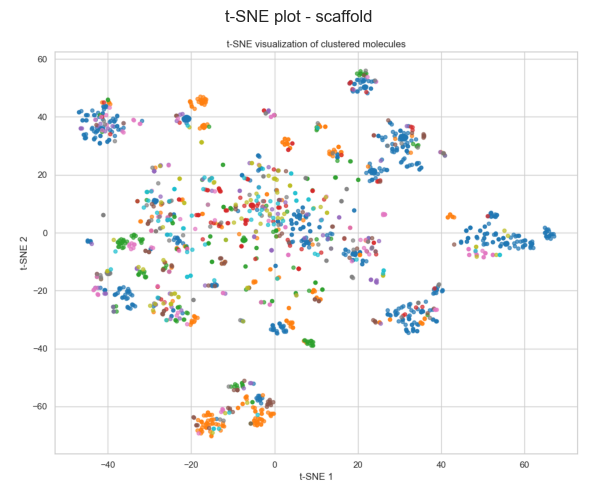

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_D1_scaffold.png


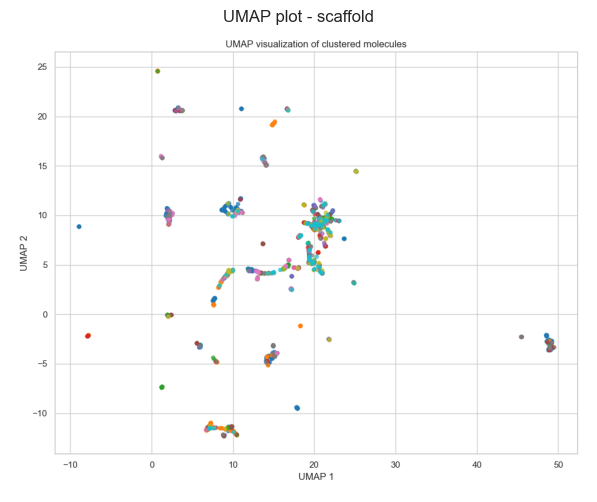


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2228
adjusted_rand_score: 0.0153
mutual_info_score: 5.5135
normalized_mutual_info_score: 0.8564
homogeneity_score: 0.8987
completeness_score: 0.8178
v_measure_score: 0.8564


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.2228
t-SNE plot saved to TSNE_plots/tsne_D1_jarvis-patrick.png


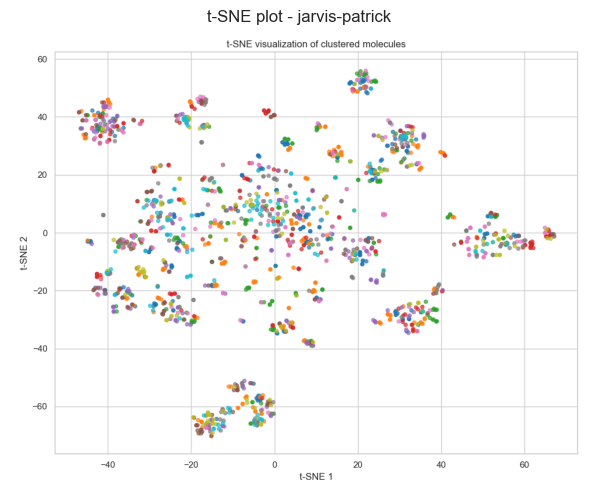

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_D1_jarvis-patrick.png


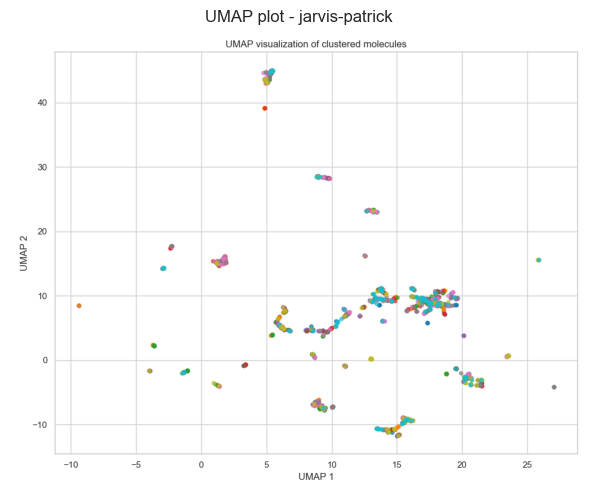


Evaluating clustering with algorithm: kmedoids
silhouette_score: -0.1064
adjusted_rand_score: 0.0000
mutual_info_score: 0.0047
normalized_mutual_info_score: 0.0015
homogeneity_score: 0.0008
completeness_score: 1.0000
v_measure_score: 0.0015
silhouette_score: -0.1064


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but recei

t-SNE plot saved to TSNE_plots/tsne_D1_kmedoids.png


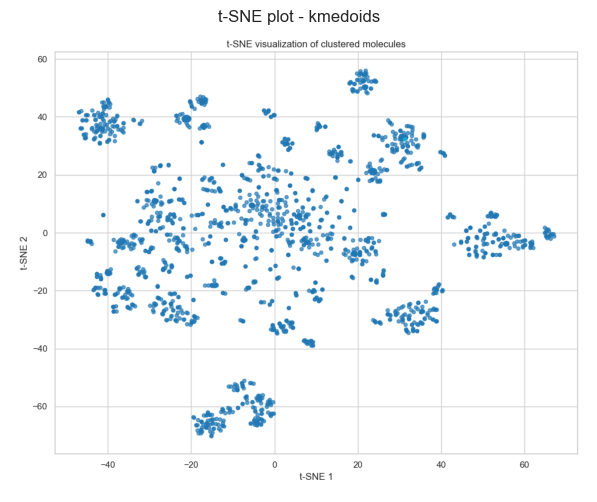

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_D1_kmedoids.png


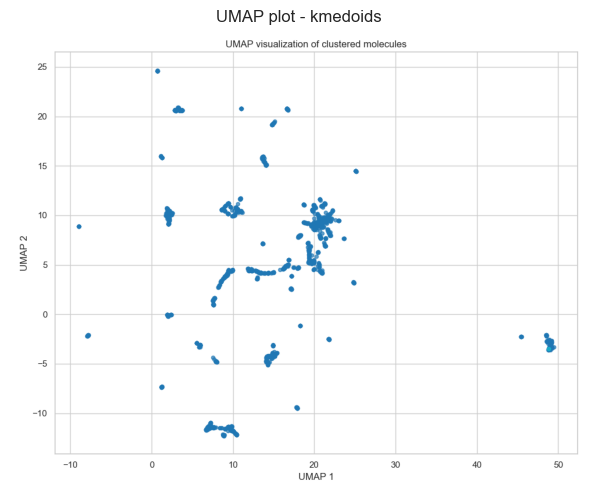


Evaluating clustering with algorithm: maxmin
silhouette_score: -0.0082
adjusted_rand_score: 0.0016
mutual_info_score: 0.4495
normalized_mutual_info_score: 0.1328
homogeneity_score: 0.0733
completeness_score: 0.7062
v_measure_score: 0.1328


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: -0.0082
t-SNE plot saved to TSNE_plots/tsne_D1_maxmin.png


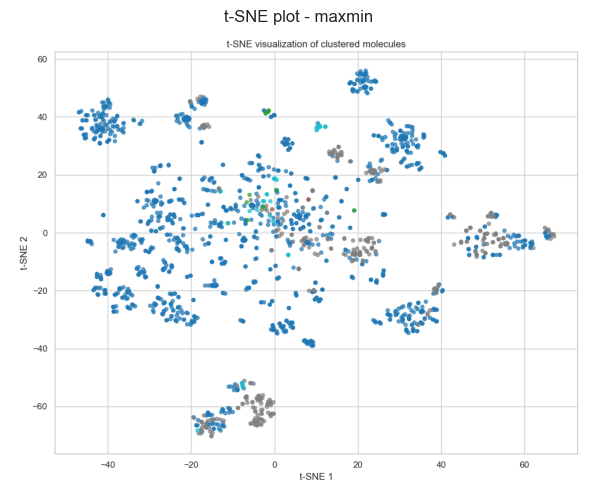

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_D1_maxmin.png


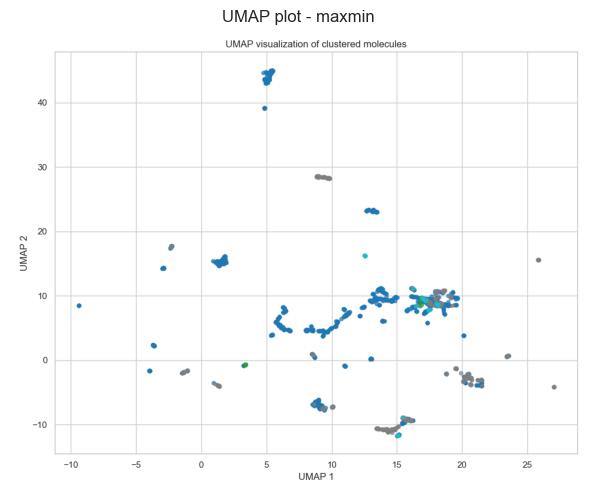


Evaluating clustering with algorithm: butina
silhouette_score: 0.2863
adjusted_rand_score: 0.0174
mutual_info_score: 4.5506
normalized_mutual_info_score: 0.7711
homogeneity_score: 0.7418
completeness_score: 0.8029
v_measure_score: 0.7711


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.2863
t-SNE plot saved to TSNE_plots/tsne_D1_butina.png


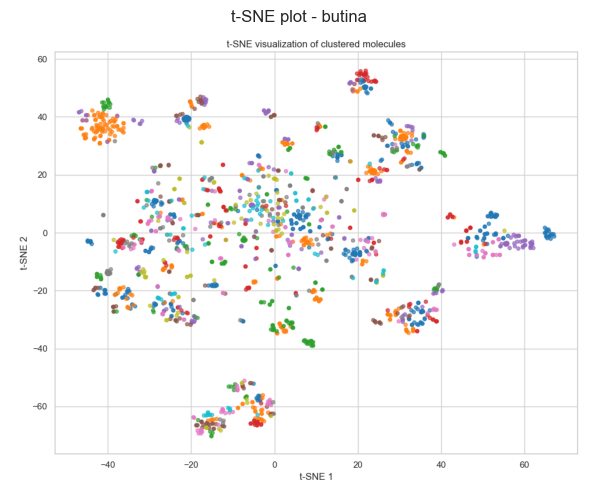

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_D1_butina.png


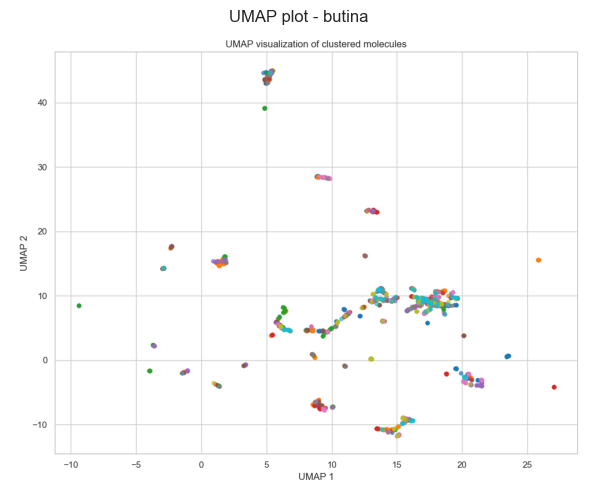


Evaluating clustering with algorithm: birch
silhouette_score: 0.0853
adjusted_rand_score: 0.0116
mutual_info_score: 0.9493
normalized_mutual_info_score: 0.2552
homogeneity_score: 0.1547
completeness_score: 0.7284
v_measure_score: 0.2552


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.0853
t-SNE plot saved to TSNE_plots/tsne_D1_birch.png


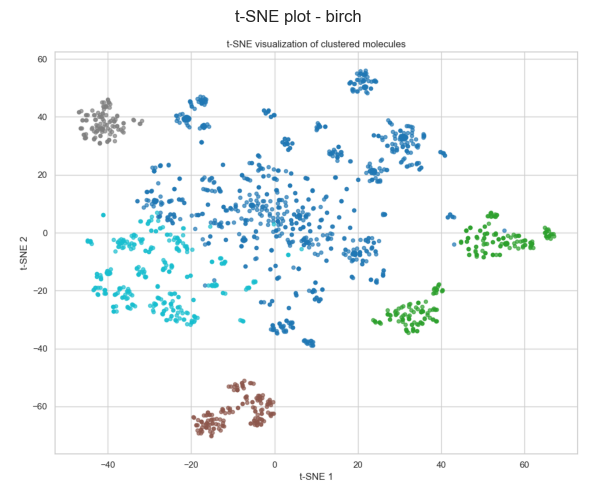

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_D1_birch.png


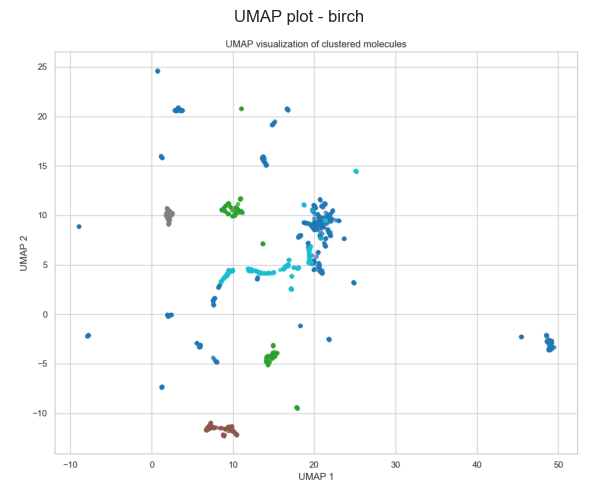


=== Processing dataset: data/cleaned_data/D2.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:329: UserWarning: Cluster 1 is empty! self.labels_[self.medoid_indices_[1]] may not be labeled with its corresponding cluster (1).
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:329: UserWarning: Cluster 3 is empty! self.labels_[self.medoid_indices_[3]] may not be labeled with its corresponding cluster (3).
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:297: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(


Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.1895
adjusted_rand_score: 0.0190
mutual_info_score: 5.3754
normalized_mutual_info_score: 0.7431
homogeneity_score: 0.7546


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

completeness_score: 0.7320
v_measure_score: 0.7431


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


silhouette_score: 0.1895
t-SNE plot saved to TSNE_plots/tsne_D2_scaffold.png


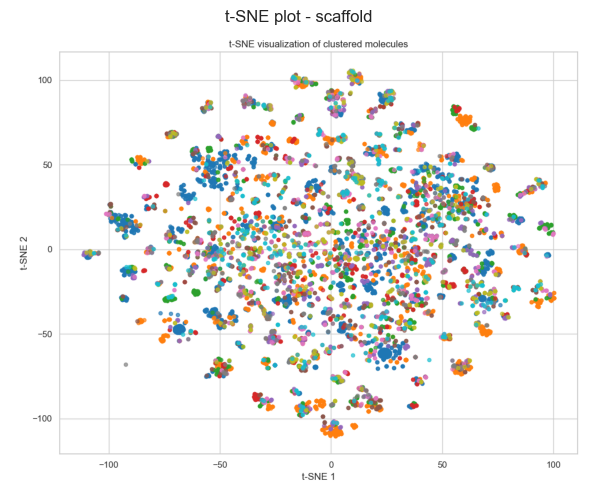

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


UMAP plot saved to UMAP_plots/umap_D2_scaffold.png


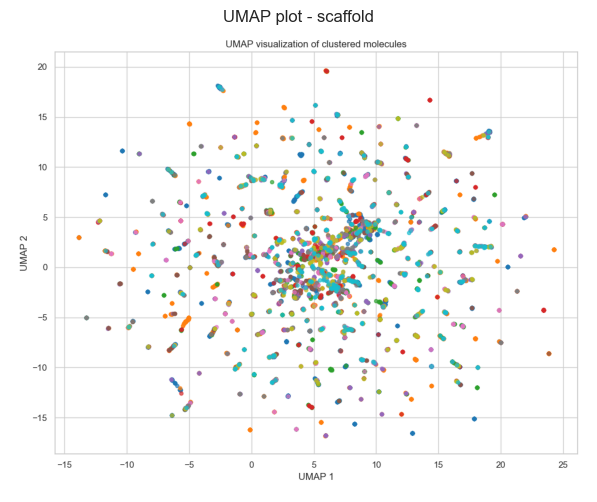


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2996
adjusted_rand_score: 0.0071
mutual_info_score: 6.4064
normalized_mutual_info_score: 0.8197
homogeneity_score: 0.8993


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

completeness_score: 0.7529
v_measure_score: 0.8197


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


silhouette_score: 0.2996
t-SNE plot saved to TSNE_plots/tsne_D2_jarvis-patrick.png


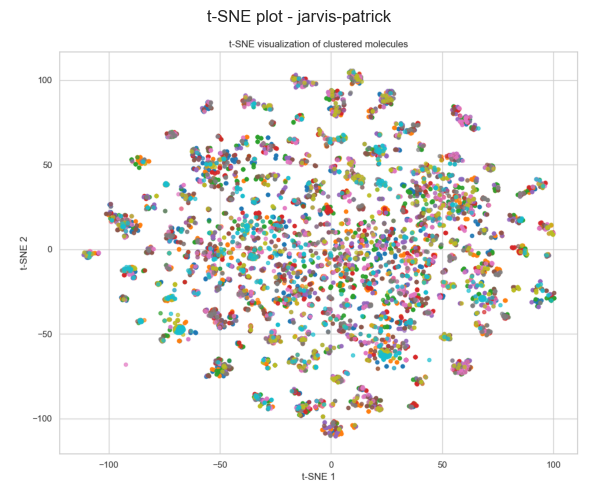

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


UMAP plot saved to UMAP_plots/umap_D2_jarvis-patrick.png


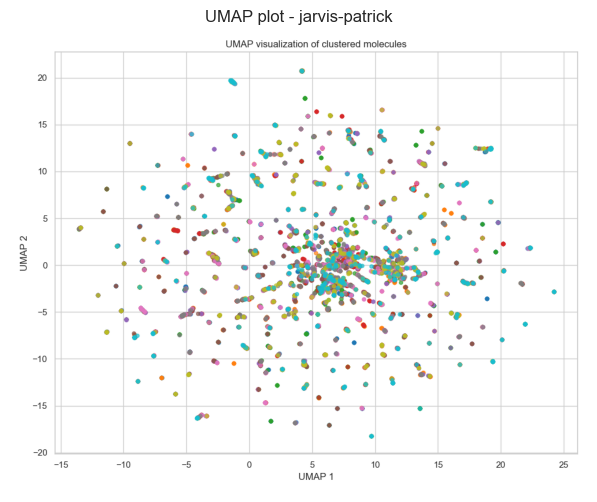


Evaluating clustering with algorithm: kmedoids
silhouette_score: -0.1042
adjusted_rand_score: 0.0001
mutual_info_score: 0.3603
normalized_mutual_info_score: 0.0882
homogeneity_score: 0.0506


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

completeness_score: 0.3428
v_measure_score: 0.0882


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


silhouette_score: -0.1042
t-SNE plot saved to TSNE_plots/tsne_D2_kmedoids.png


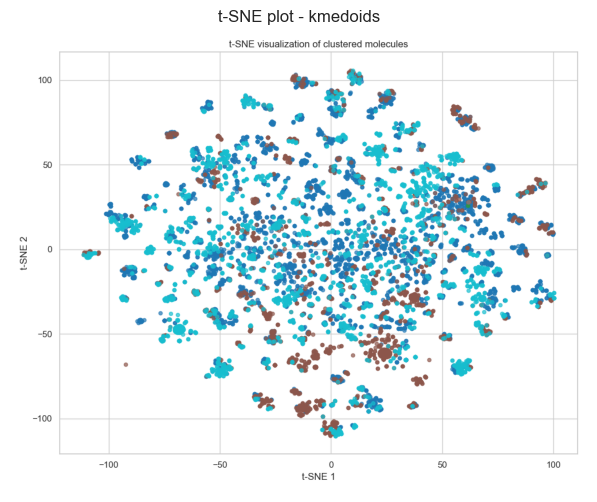

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


UMAP plot saved to UMAP_plots/umap_D2_kmedoids.png


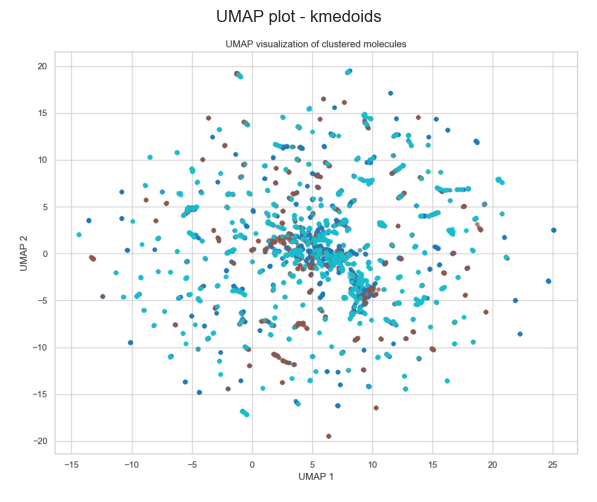


Evaluating clustering with algorithm: maxmin
silhouette_score: -0.0259
adjusted_rand_score: -0.0011
mutual_info_score: 0.1731
normalized_mutual_info_score: 0.0461
homogeneity_score: 0.0243


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

completeness_score: 0.4433
v_measure_score: 0.0461


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


silhouette_score: -0.0259
t-SNE plot saved to TSNE_plots/tsne_D2_maxmin.png


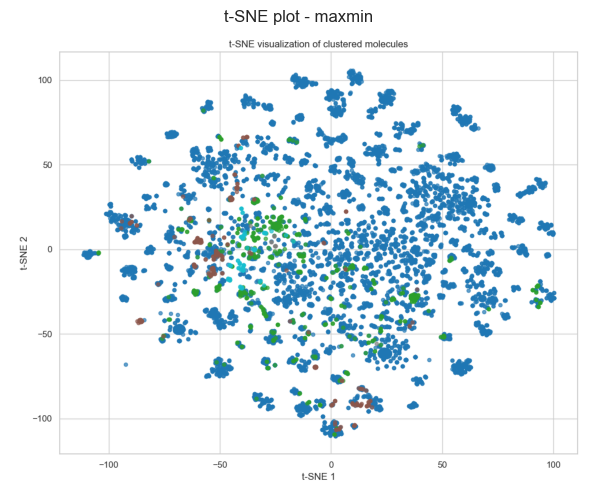

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


UMAP plot saved to UMAP_plots/umap_D2_maxmin.png


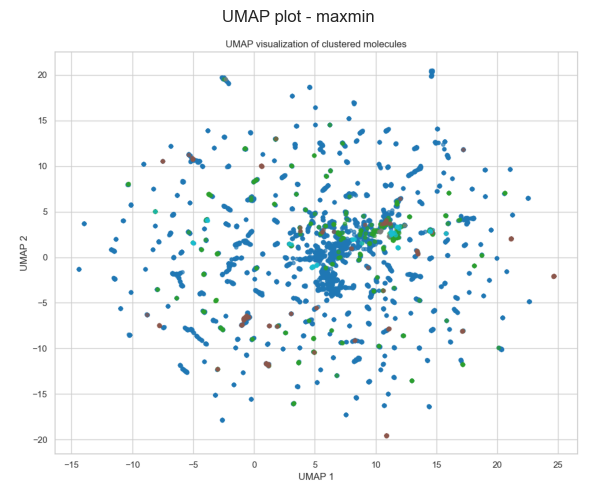


Evaluating clustering with algorithm: butina
silhouette_score: 0.2832
adjusted_rand_score: 0.0170
mutual_info_score: 5.0658
normalized_mutual_info_score: 0.7168
homogeneity_score: 0.7111


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

completeness_score: 0.7225
v_measure_score: 0.7168


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


silhouette_score: 0.2832
t-SNE plot saved to TSNE_plots/tsne_D2_butina.png


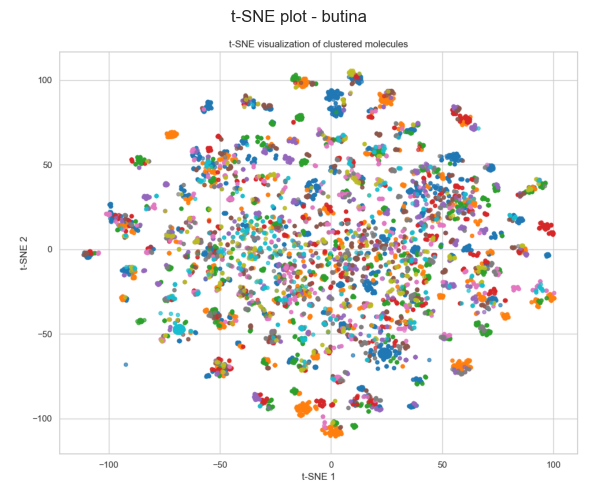

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


UMAP plot saved to UMAP_plots/umap_D2_butina.png


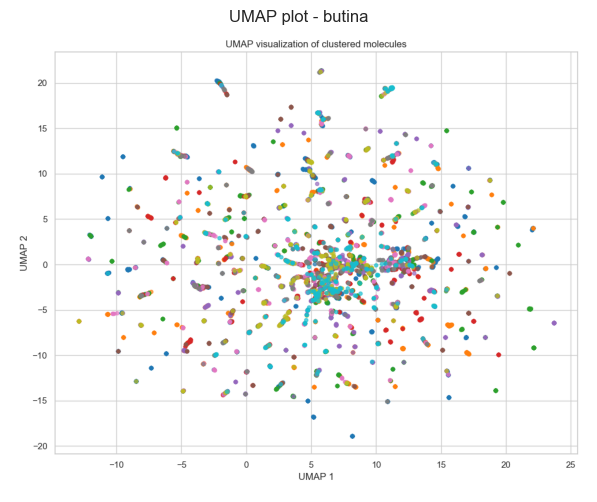


Evaluating clustering with algorithm: birch
silhouette_score: 0.0315
adjusted_rand_score: 0.0041
mutual_info_score: 0.6023
normalized_mutual_info_score: 0.1447


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

homogeneity_score: 0.0845
completeness_score: 0.5015
v_measure_score: 0.1447


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)


silhouette_score: 0.0315
t-SNE plot saved to TSNE_plots/tsne_D2_birch.png


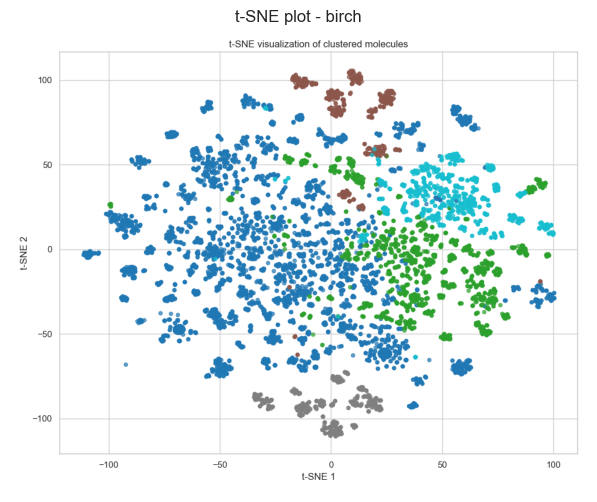

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


UMAP plot saved to UMAP_plots/umap_D2_birch.png


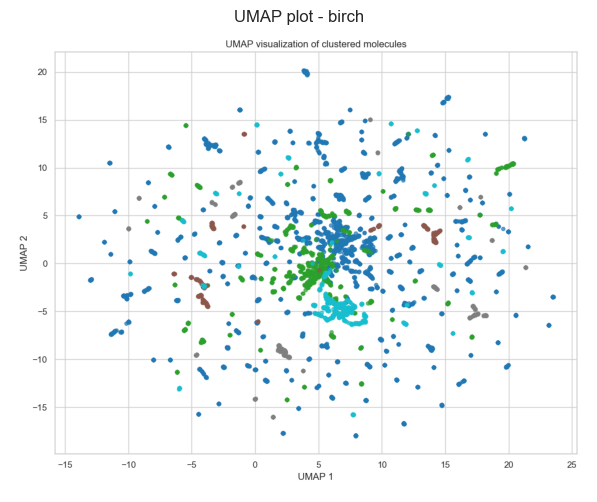


=== Processing dataset: data/cleaned_data/H1.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:297: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(


Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.1794
adjusted_rand_score: 0.0357
mutual_info_score: 4.8027
normalized_mutual_info_score: 0.7918
homogeneity_score: 0.8058
completeness_score: 0.7783
v_measure_score: 0.7918


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.1794
t-SNE plot saved to TSNE_plots/tsne_H1_scaffold.png


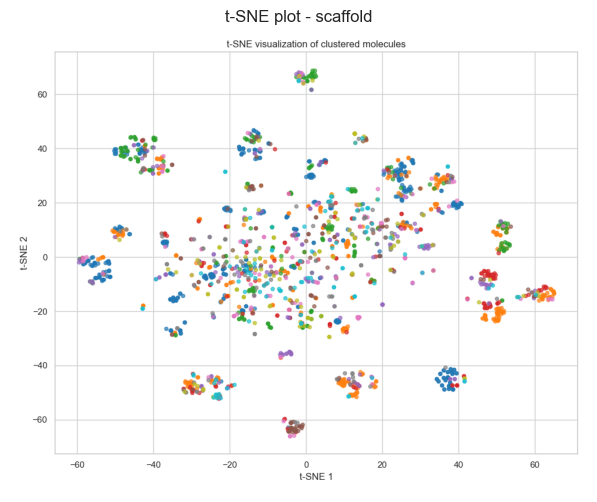

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_H1_scaffold.png


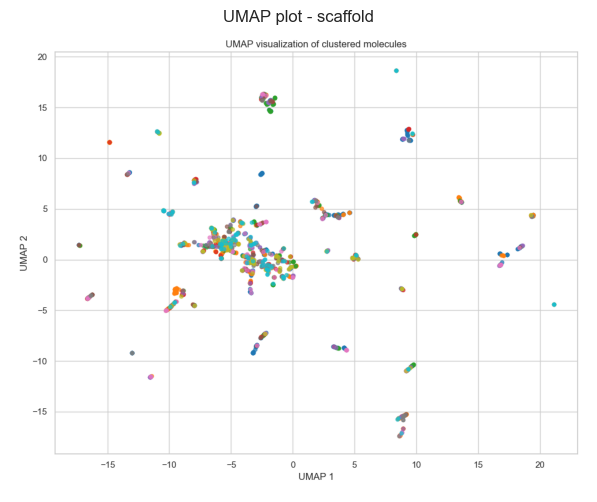


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2213
adjusted_rand_score: 0.0212
mutual_info_score: 5.2644
normalized_mutual_info_score: 0.8289
homogeneity_score: 0.8833
completeness_score: 0.7809
v_measure_score: 0.8289


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.2213
t-SNE plot saved to TSNE_plots/tsne_H1_jarvis-patrick.png


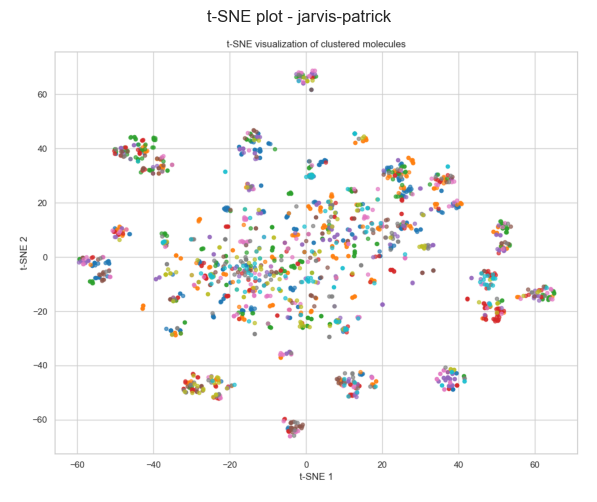

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_H1_jarvis-patrick.png


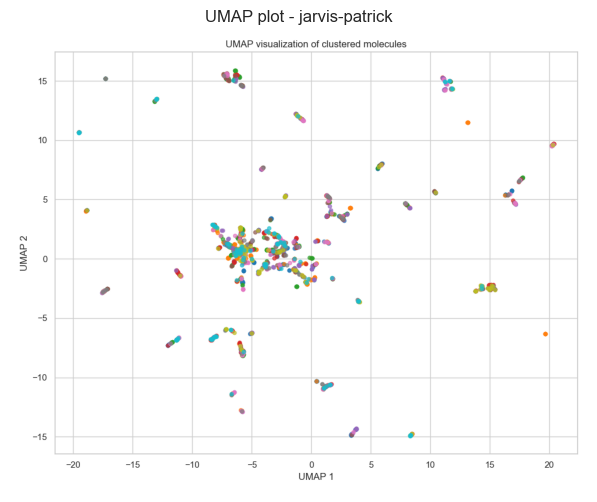


Evaluating clustering with algorithm: kmedoids
silhouette_score: 0.0149
adjusted_rand_score: 0.0081
mutual_info_score: 0.9426
normalized_mutual_info_score: 0.2493
homogeneity_score: 0.1582
completeness_score: 0.5888
v_measure_score: 0.2493


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.0149
t-SNE plot saved to TSNE_plots/tsne_H1_kmedoids.png


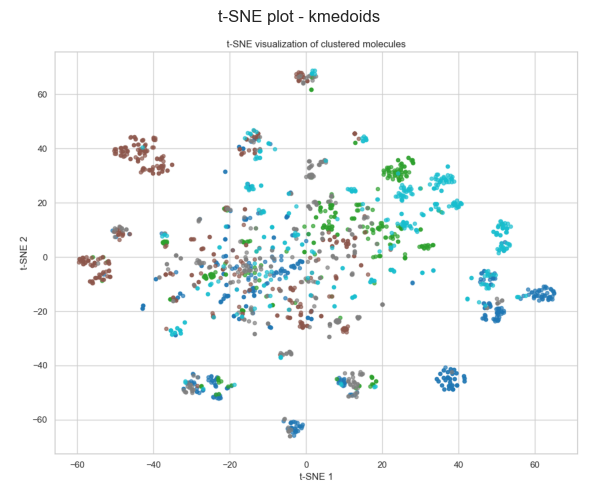

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_H1_kmedoids.png


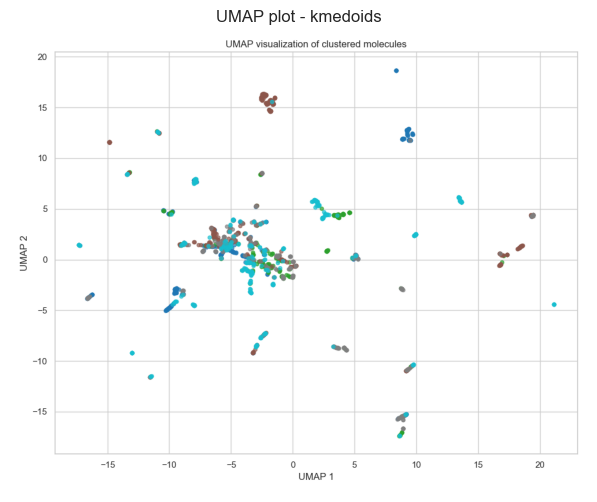


Evaluating clustering with algorithm: maxmin
silhouette_score: -0.0066
adjusted_rand_score: 0.0005
mutual_info_score: 0.4710
normalized_mutual_info_score: 0.1409
homogeneity_score: 0.0790
completeness_score: 0.6476
v_measure_score: 0.1409


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: -0.0066
t-SNE plot saved to TSNE_plots/tsne_H1_maxmin.png


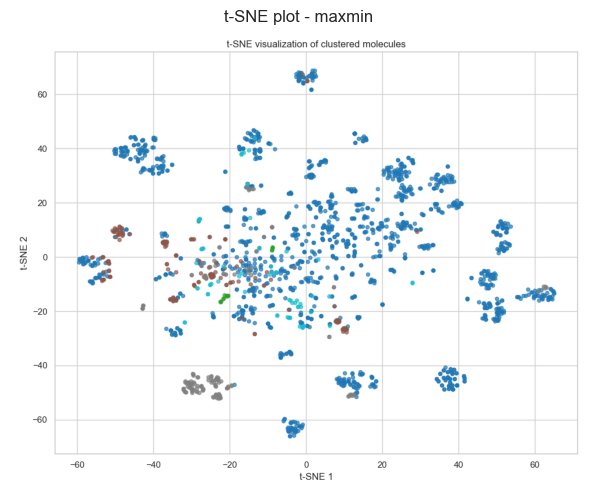

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_H1_maxmin.png


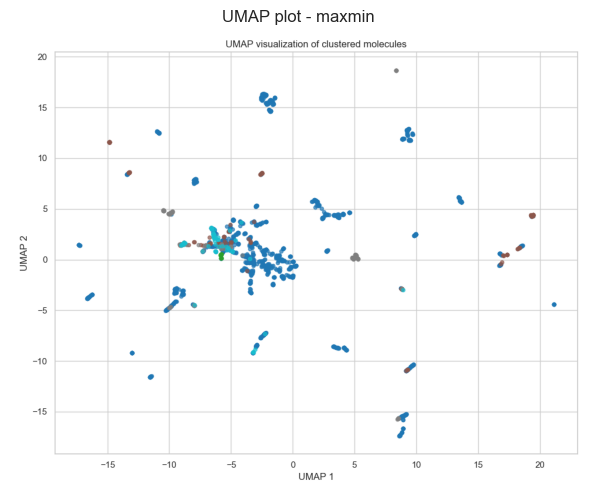


Evaluating clustering with algorithm: butina
silhouette_score: 0.2771
adjusted_rand_score: 0.0452
mutual_info_score: 4.4778
normalized_mutual_info_score: 0.7619
homogeneity_score: 0.7513
completeness_score: 0.7728
v_measure_score: 0.7619


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.2771
t-SNE plot saved to TSNE_plots/tsne_H1_butina.png


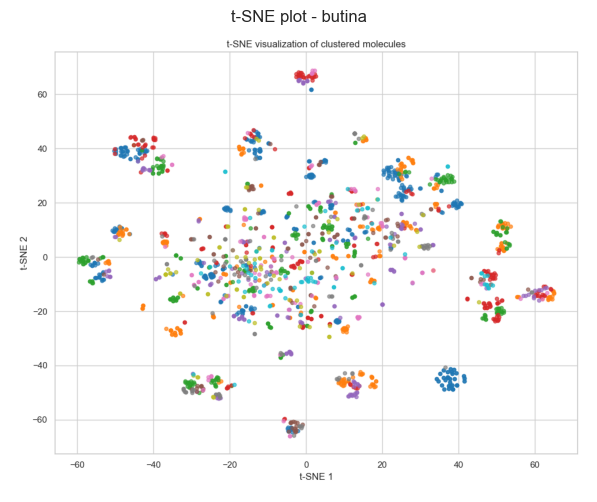

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_H1_butina.png


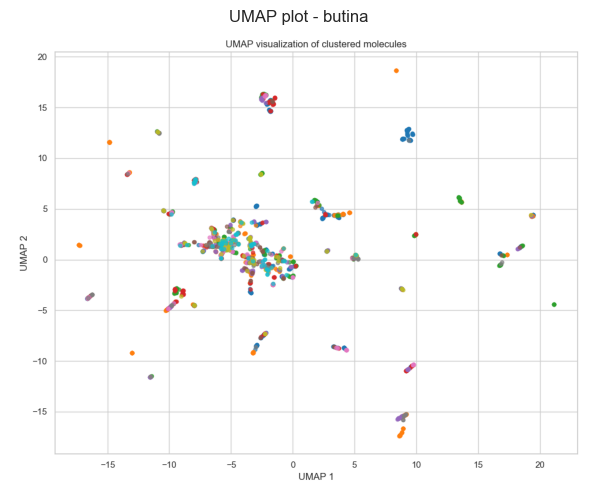


Evaluating clustering with algorithm: birch
silhouette_score: 0.0831
adjusted_rand_score: 0.0094
mutual_info_score: 0.7487
normalized_mutual_info_score: 0.2121
homogeneity_score: 0.1256
completeness_score: 0.6802
v_measure_score: 0.2121


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.0831
t-SNE plot saved to TSNE_plots/tsne_H1_birch.png


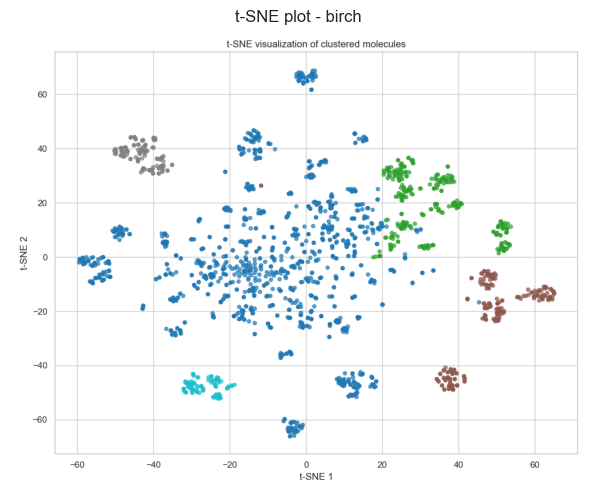

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_H1_birch.png


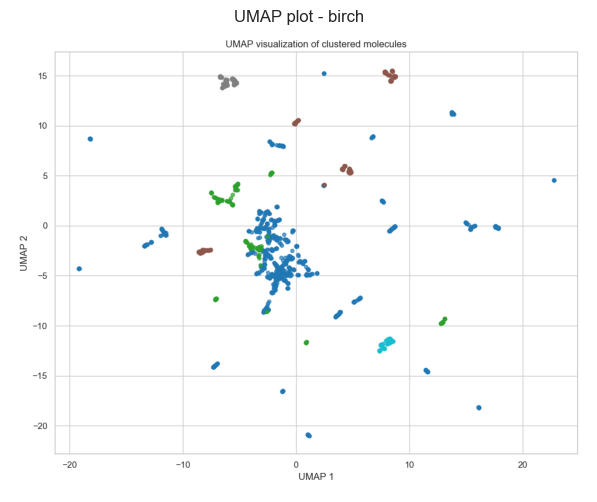


=== Processing dataset: data/cleaned_data/H2.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:297: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(


Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.1387
adjusted_rand_score: 0.0387
mutual_info_score: 4.3171
normalized_mutual_info_score: 0.8147
homogeneity_score: 0.8190
completeness_score: 0.8104
v_measure_score: 0.8147
silhouette_score: 0.1387


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

t-SNE plot saved to TSNE_plots/tsne_H2_scaffold.png


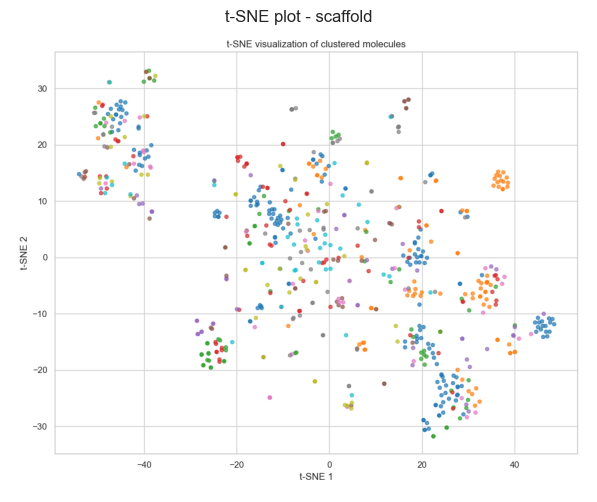

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_H2_scaffold.png


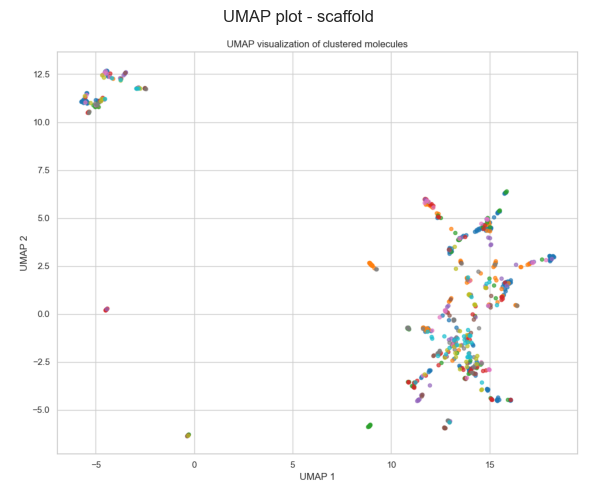


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2414
adjusted_rand_score: 0.0246
mutual_info_score: 4.6138
normalized_mutual_info_score: 0.8414
homogeneity_score: 0.8753
completeness_score: 0.8100
v_measure_score: 0.8414


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.2414
t-SNE plot saved to TSNE_plots/tsne_H2_jarvis-patrick.png


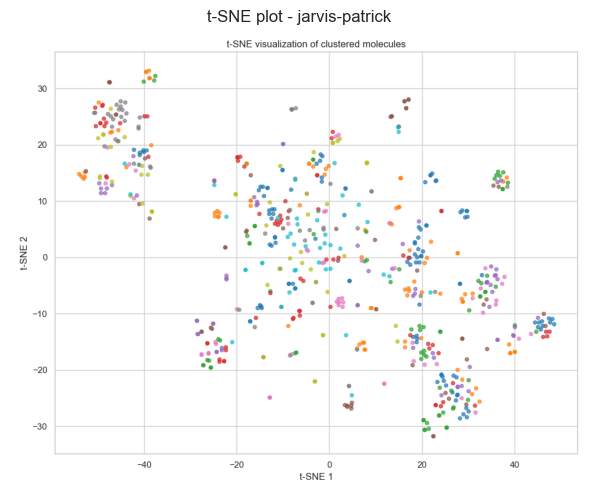

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_H2_jarvis-patrick.png


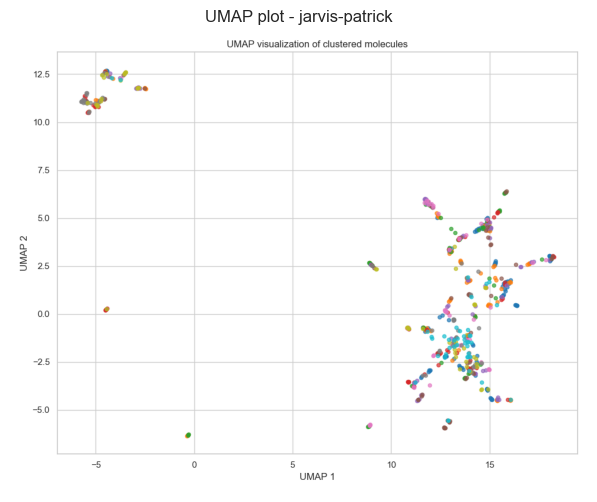


Evaluating clustering with algorithm: kmedoids
silhouette_score: 0.0460
adjusted_rand_score: 0.0160
mutual_info_score: 1.1308
normalized_mutual_info_score: 0.3306
homogeneity_score: 0.2145
completeness_score: 0.7199
v_measure_score: 0.3306
silhouette_score: 0.0460


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

t-SNE plot saved to TSNE_plots/tsne_H2_kmedoids.png


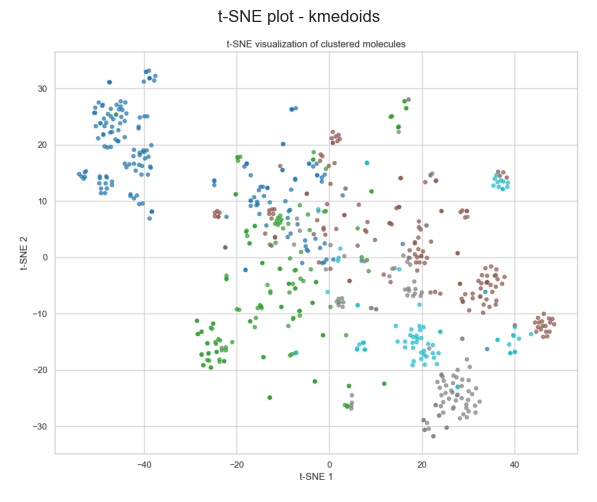

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_H2_kmedoids.png


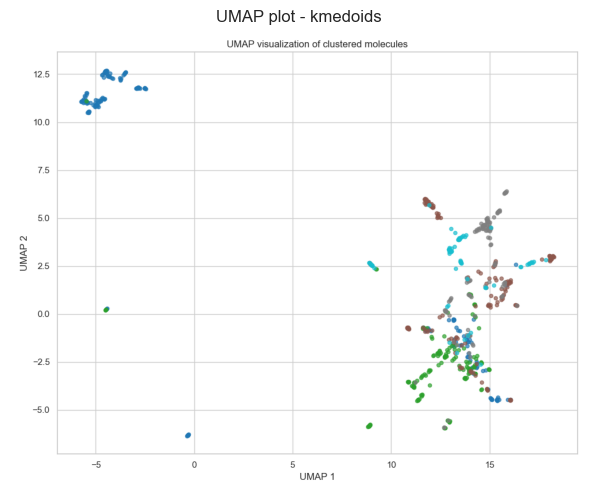


Evaluating clustering with algorithm: maxmin
silhouette_score: 0.0144
adjusted_rand_score: 0.0245
mutual_info_score: 0.7094
normalized_mutual_info_score: 0.2310
homogeneity_score: 0.1346
completeness_score: 0.8143
v_measure_score: 0.2310
silhouette_score: 0.0144


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

t-SNE plot saved to TSNE_plots/tsne_H2_maxmin.png


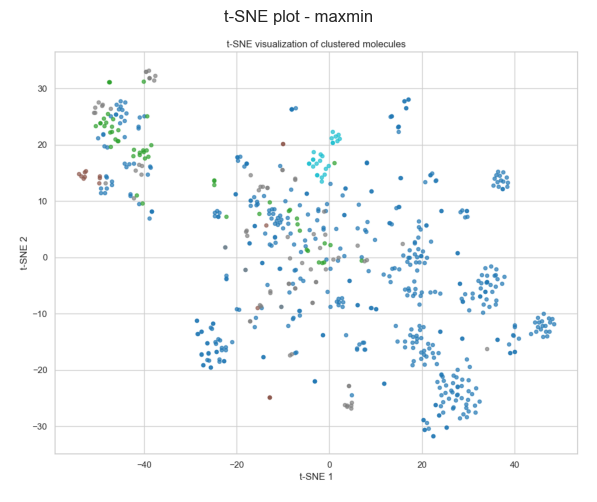

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_H2_maxmin.png


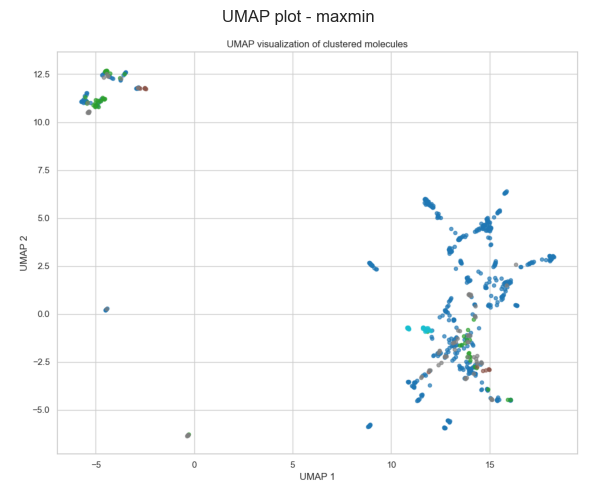


Evaluating clustering with algorithm: butina
silhouette_score: 0.2664
adjusted_rand_score: 0.0477
mutual_info_score: 3.9574
normalized_mutual_info_score: 0.7768
homogeneity_score: 0.7508
completeness_score: 0.8047
v_measure_score: 0.7768
silhouette_score: 0.2664


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

t-SNE plot saved to TSNE_plots/tsne_H2_butina.png


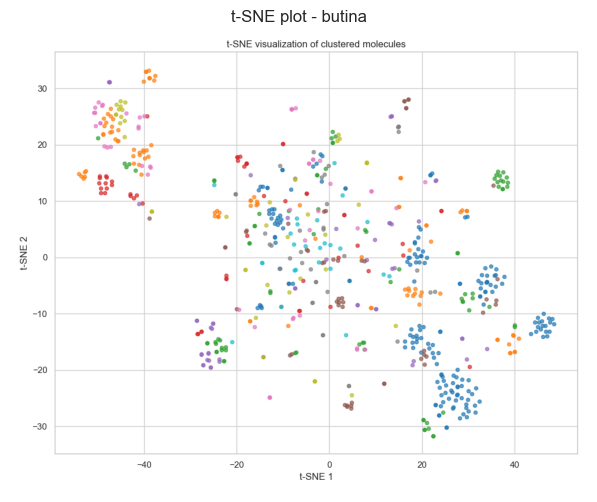

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_H2_butina.png


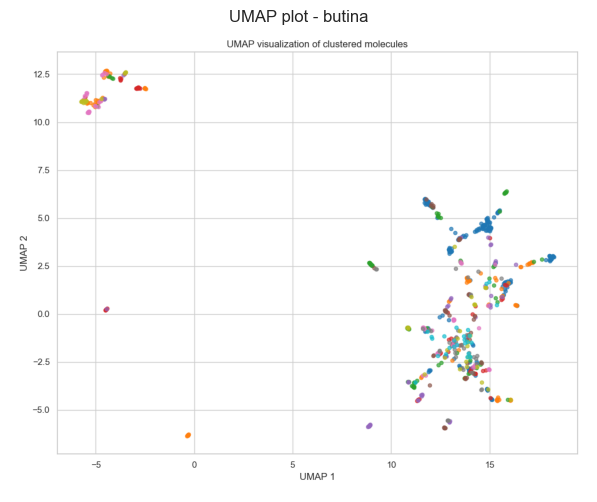


Evaluating clustering with algorithm: birch
silhouette_score: 0.0753
adjusted_rand_score: 0.0621
mutual_info_score: 0.9954
normalized_mutual_info_score: 0.3069
homogeneity_score: 0.1888
completeness_score: 0.8181
v_measure_score: 0.3069
silhouette_score: 0.0753


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

t-SNE plot saved to TSNE_plots/tsne_H2_birch.png


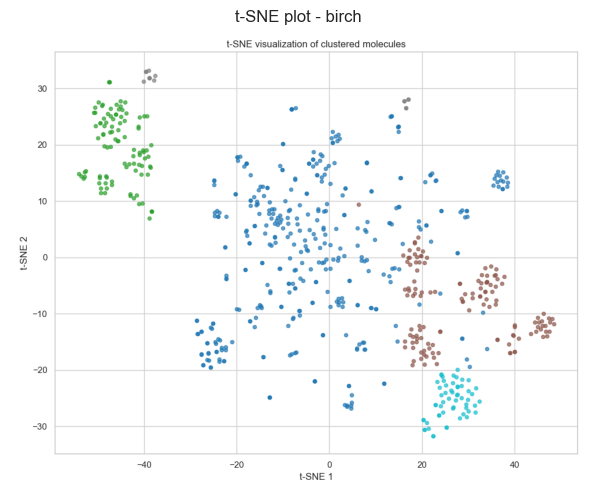

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_H2_birch.png


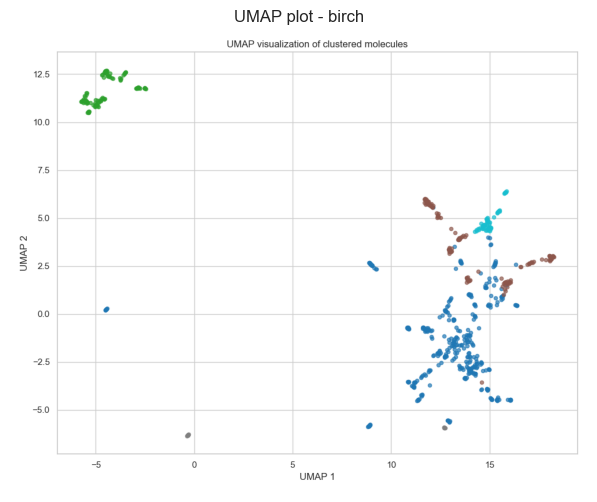


=== Processing dataset: data/cleaned_data/M1.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:329: UserWarning: Cluster 3 is empty! self.labels_[self.medoid_indices_[3]] may not be labeled with its corresponding cluster (3).
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:329: UserWarning: Cluster 4 is empty! self.labels_[self.medoid_indices_[4]] may not be labeled with its corresponding cluster (4).
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:297: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(


Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.1994
adjusted_rand_score: 0.0530
mutual_info_score: 5.0377
normalized_mutual_info_score: 0.8212
homogeneity_score: 0.8022
completeness_score: 0.8412
v_measure_score: 0.8212


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.1994
t-SNE plot saved to TSNE_plots/tsne_M1_scaffold.png


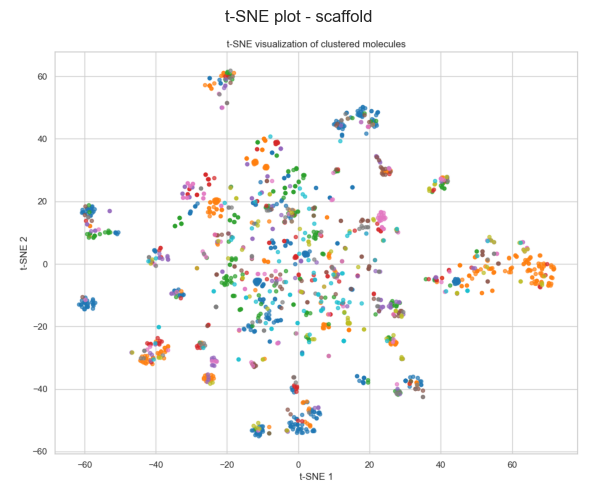

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_M1_scaffold.png


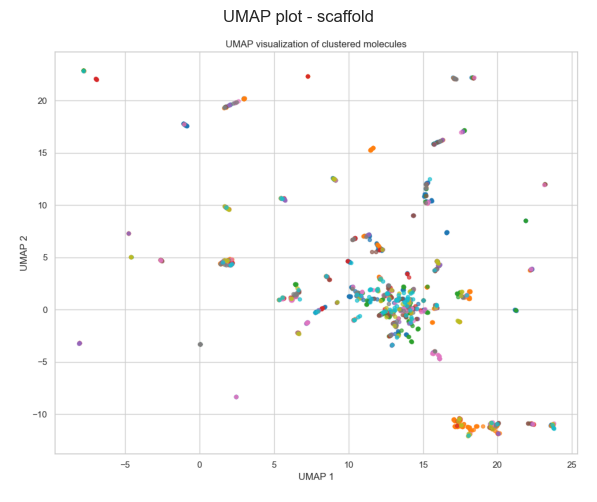


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2418
adjusted_rand_score: 0.0197
mutual_info_score: 5.5408
normalized_mutual_info_score: 0.8607
homogeneity_score: 0.8823
completeness_score: 0.8400
v_measure_score: 0.8607
silhouette_score: 0.2418


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

t-SNE plot saved to TSNE_plots/tsne_M1_jarvis-patrick.png


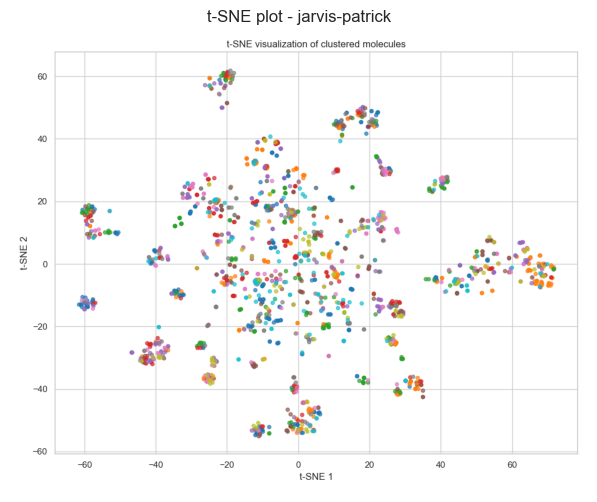

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_M1_jarvis-patrick.png


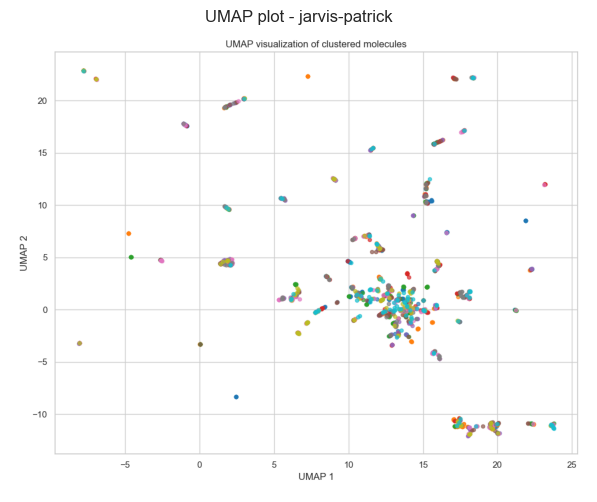


Evaluating clustering with algorithm: kmedoids
silhouette_score: 0.0014
adjusted_rand_score: 0.0058
mutual_info_score: 0.8358
normalized_mutual_info_score: 0.2221
homogeneity_score: 0.1331
completeness_score: 0.6705
v_measure_score: 0.2221
silhouette_score: 0.0014


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

t-SNE plot saved to TSNE_plots/tsne_M1_kmedoids.png


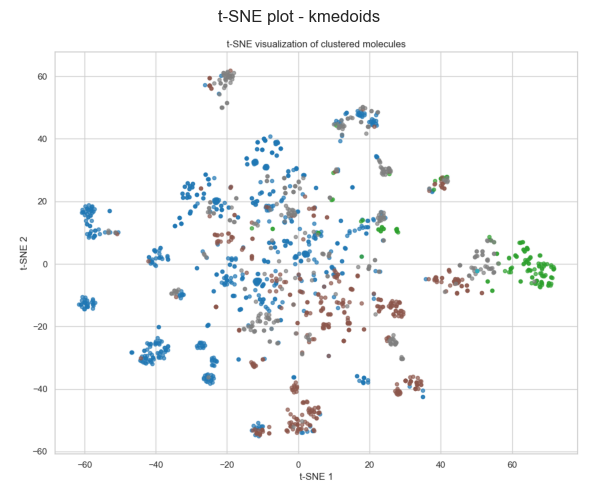

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_M1_kmedoids.png


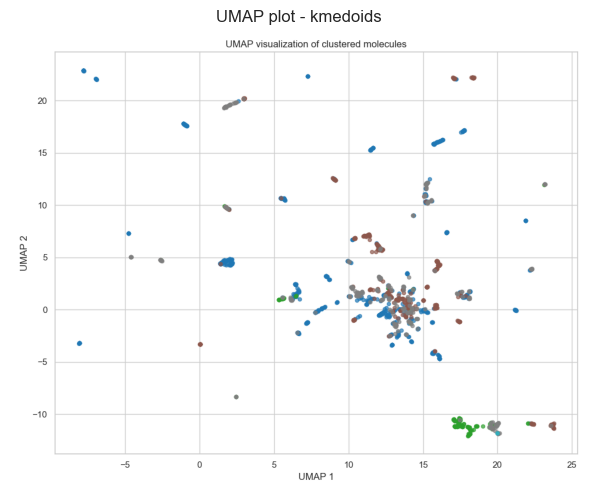


Evaluating clustering with algorithm: maxmin
silhouette_score: -0.0202
adjusted_rand_score: -0.0018
mutual_info_score: 0.6128
normalized_mutual_info_score: 0.1705
homogeneity_score: 0.0976
completeness_score: 0.6740
v_measure_score: 0.1705
silhouette_score: -0.0202


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

t-SNE plot saved to TSNE_plots/tsne_M1_maxmin.png


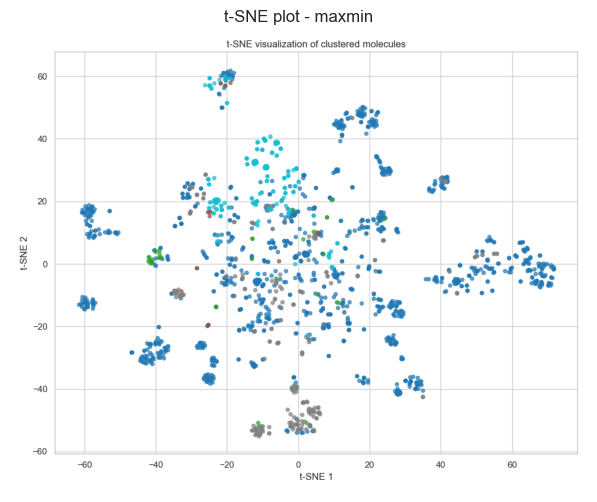

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_M1_maxmin.png


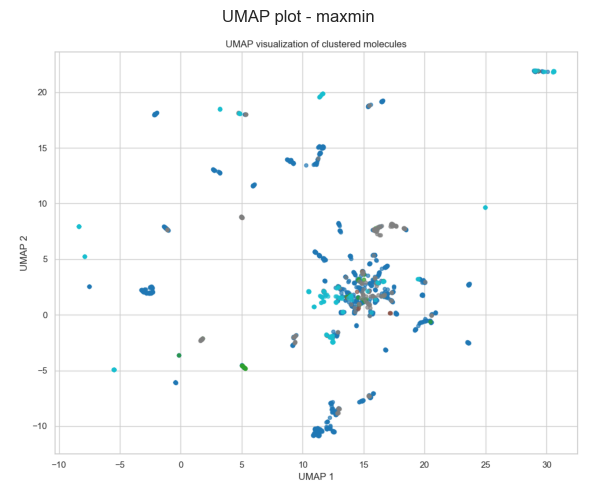


Evaluating clustering with algorithm: butina
silhouette_score: 0.3382
adjusted_rand_score: 0.0258
mutual_info_score: 4.7409
normalized_mutual_info_score: 0.7907
homogeneity_score: 0.7550
completeness_score: 0.8299
v_measure_score: 0.7907


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.3382
t-SNE plot saved to TSNE_plots/tsne_M1_butina.png


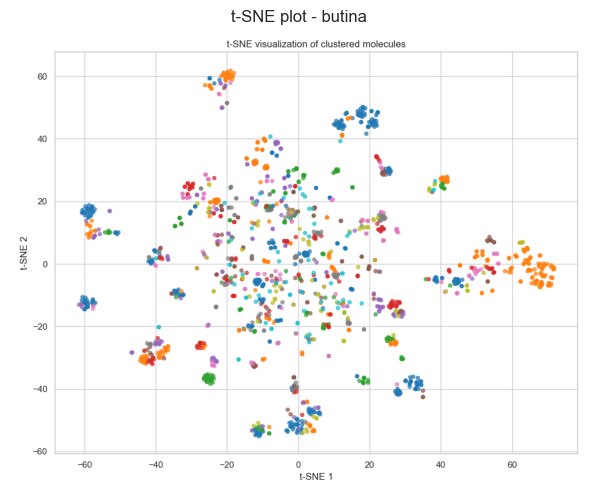

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_M1_butina.png


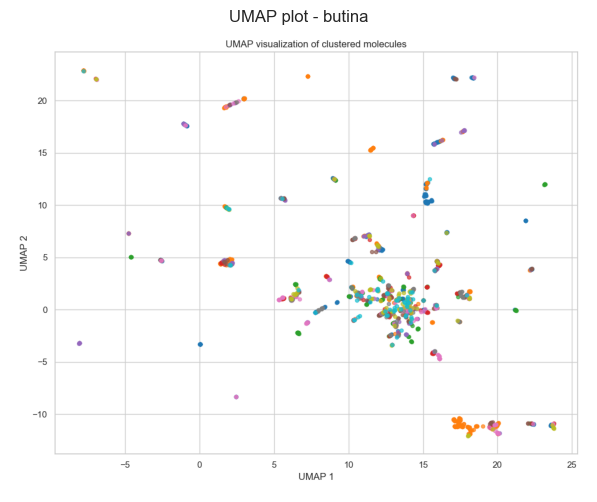


Evaluating clustering with algorithm: birch
silhouette_score: 0.0593
adjusted_rand_score: -0.0008
mutual_info_score: 0.5692
normalized_mutual_info_score: 0.1608
homogeneity_score: 0.0906
completeness_score: 0.7122
v_measure_score: 0.1608


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.0593
t-SNE plot saved to TSNE_plots/tsne_M1_birch.png


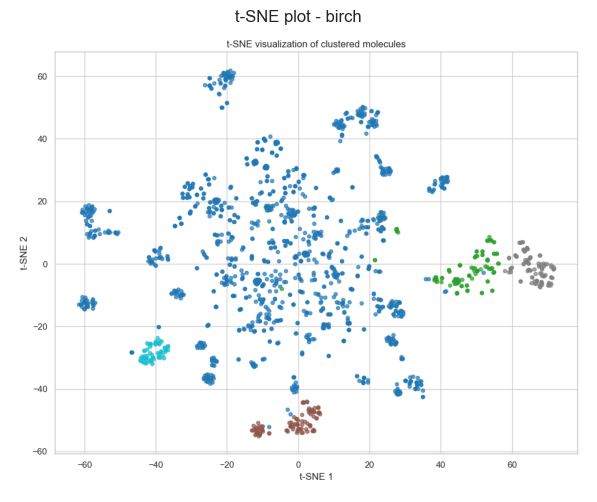

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_M1_birch.png


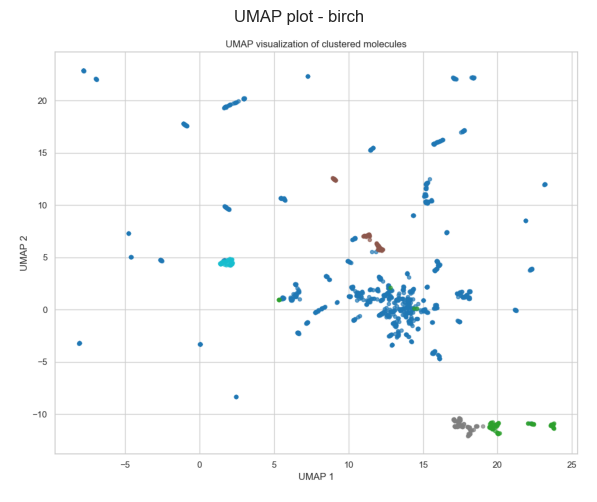


=== Processing dataset: data/cleaned_data/M2.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:329: UserWarning: Cluster 2 is empty! self.labels_[self.medoid_indices_[2]] may not be labeled with its corresponding cluster (2).
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:329: UserWarning: Cluster 3 is empty! self.labels_[self.medoid_indices_[3]] may not be labeled with its corresponding cluster (3).
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:329: UserWarning: Cluster 4 is empty! self.labels_[self.medoid_indices_[4]] may not be labeled with its corresponding cluster (4).
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:297: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  

Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.2285
adjusted_rand_score: 0.0469
mutual_info_score: 5.1224
normalized_mutual_info_score: 0.8164
homogeneity_score: 0.7827


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

completeness_score: 0.8532
v_measure_score: 0.8164
silhouette_score: 0.2285
t-SNE plot saved to TSNE_plots/tsne_M2_scaffold.png


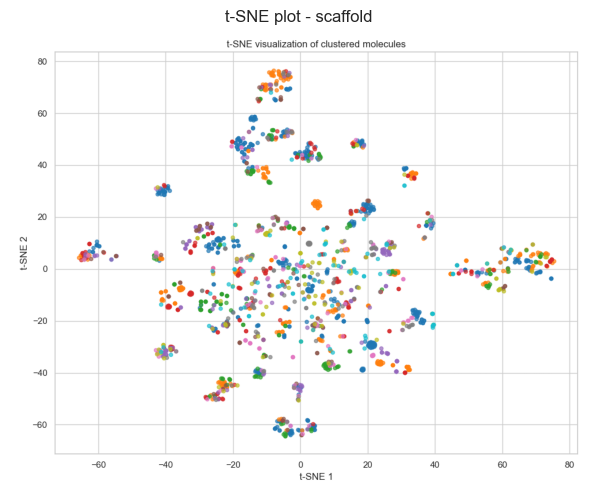

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_M2_scaffold.png


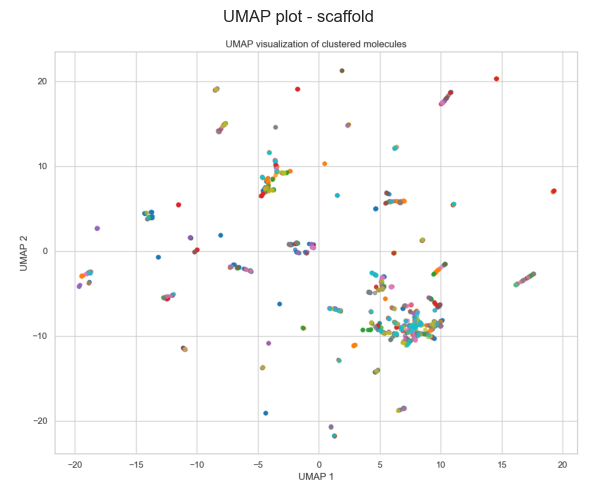


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2694
adjusted_rand_score: 0.0339
mutual_info_score: 5.7527
normalized_mutual_info_score: 0.8692
homogeneity_score: 0.8790
completeness_score: 0.8595
v_measure_score: 0.8692


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.2694
t-SNE plot saved to TSNE_plots/tsne_M2_jarvis-patrick.png


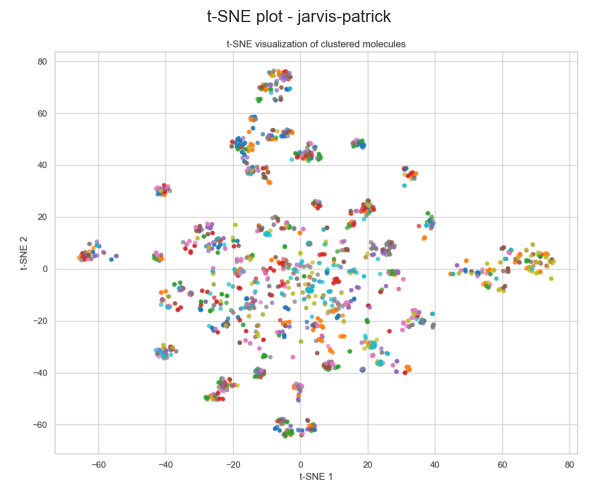

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_M2_jarvis-patrick.png


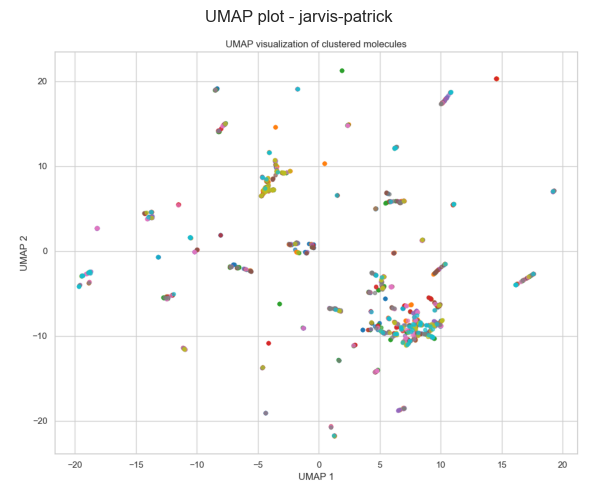


Evaluating clustering with algorithm: kmedoids
silhouette_score: -0.1055
adjusted_rand_score: 0.0000
mutual_info_score: 0.0044
normalized_mutual_info_score: 0.0014
homogeneity_score: 0.0007
completeness_score: 1.0000
v_measure_score: 0.0014


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but recei

silhouette_score: -0.1055
t-SNE plot saved to TSNE_plots/tsne_M2_kmedoids.png


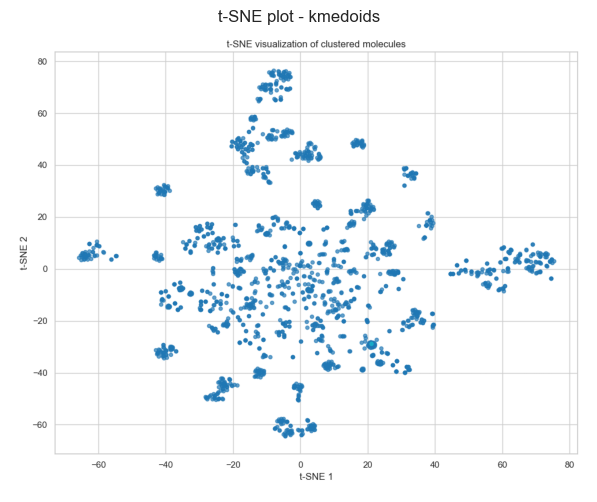

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_M2_kmedoids.png


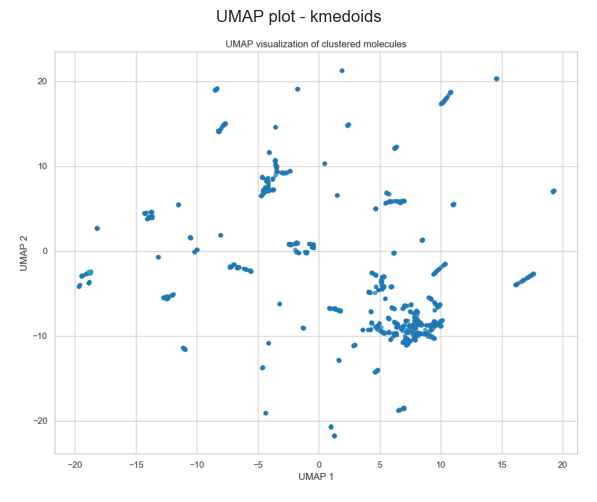


Evaluating clustering with algorithm: maxmin
silhouette_score: 0.0069
adjusted_rand_score: 0.0009
mutual_info_score: 0.5372
normalized_mutual_info_score: 0.1475
homogeneity_score: 0.0821
completeness_score: 0.7261
v_measure_score: 0.1475


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.0069
t-SNE plot saved to TSNE_plots/tsne_M2_maxmin.png


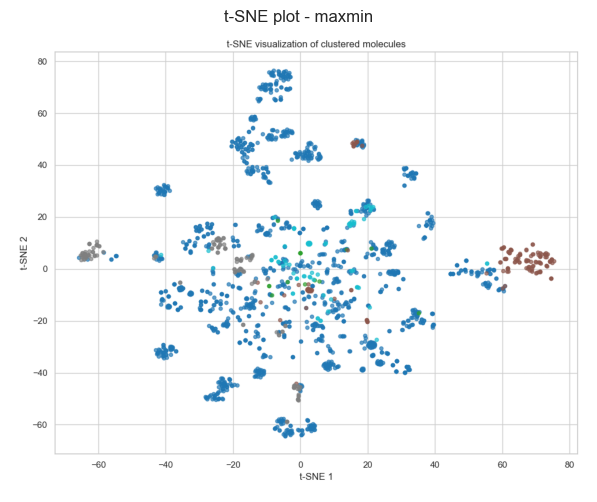

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_M2_maxmin.png


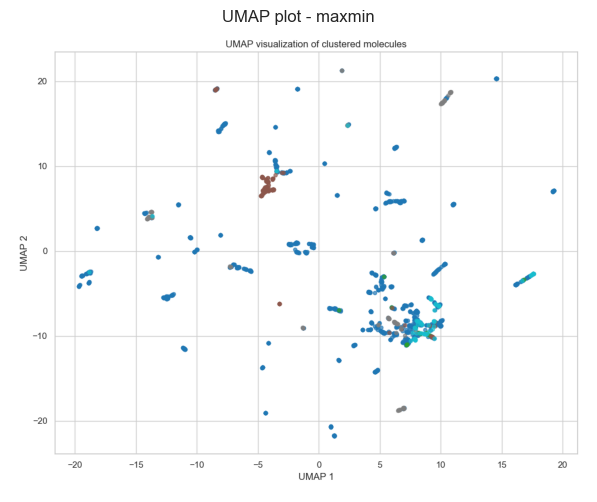


Evaluating clustering with algorithm: butina
silhouette_score: 0.3392
adjusted_rand_score: 0.0368
mutual_info_score: 4.7865
normalized_mutual_info_score: 0.7851
homogeneity_score: 0.7313
completeness_score: 0.8473
v_measure_score: 0.7851


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.3392
t-SNE plot saved to TSNE_plots/tsne_M2_butina.png


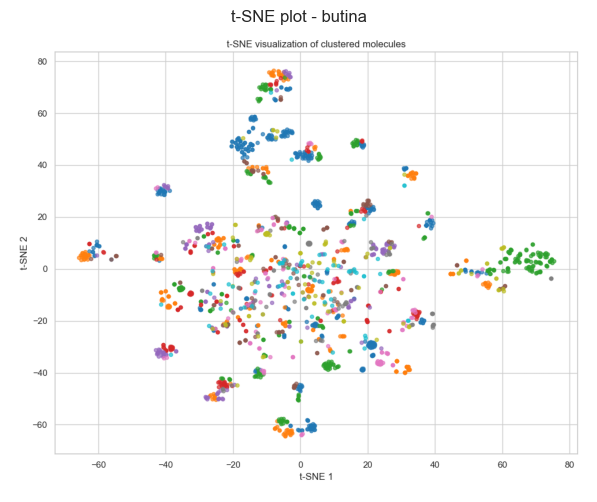

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_M2_butina.png


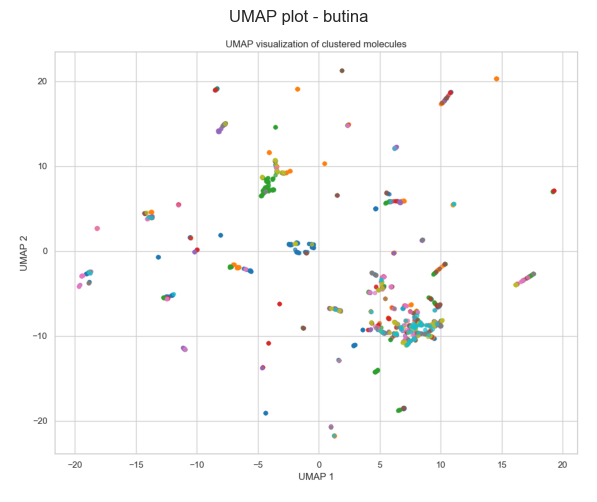


Evaluating clustering with algorithm: birch
silhouette_score: 0.0956
adjusted_rand_score: 0.0049
mutual_info_score: 0.8123
normalized_mutual_info_score: 0.2131
homogeneity_score: 0.1241
completeness_score: 0.7522
v_measure_score: 0.2131


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.0956
t-SNE plot saved to TSNE_plots/tsne_M2_birch.png


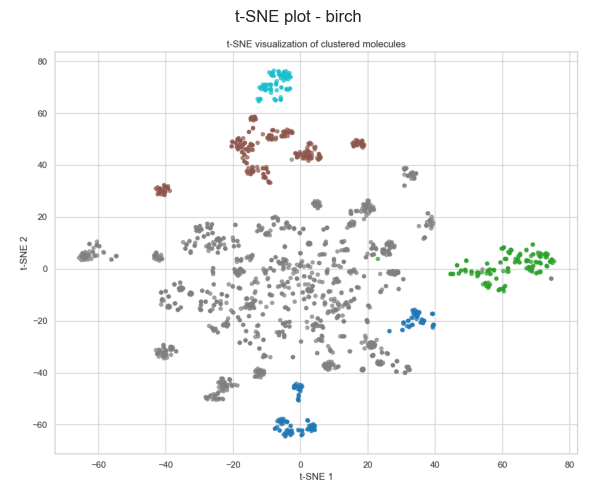

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_M2_birch.png


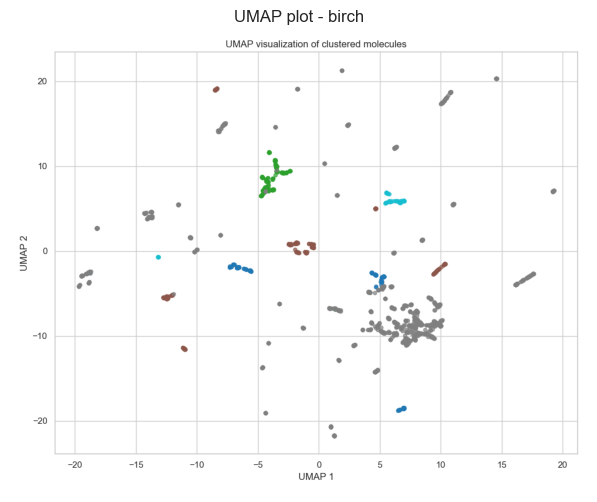


=== Processing dataset: data/cleaned_data/α1A.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:297: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(


Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.2381
adjusted_rand_score: 0.0586
mutual_info_score: 4.6787
normalized_mutual_info_score: 0.7822


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

homogeneity_score: 0.7419
completeness_score: 0.8272
v_measure_score: 0.7822
silhouette_score: 0.2381
t-SNE plot saved to TSNE_plots/tsne_α1A_scaffold.png


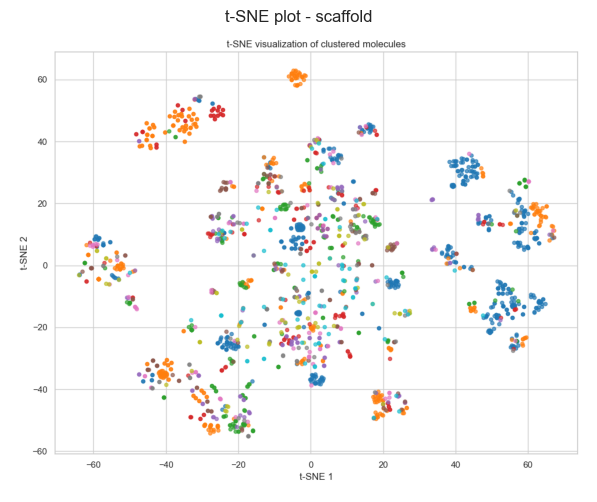

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_α1A_scaffold.png


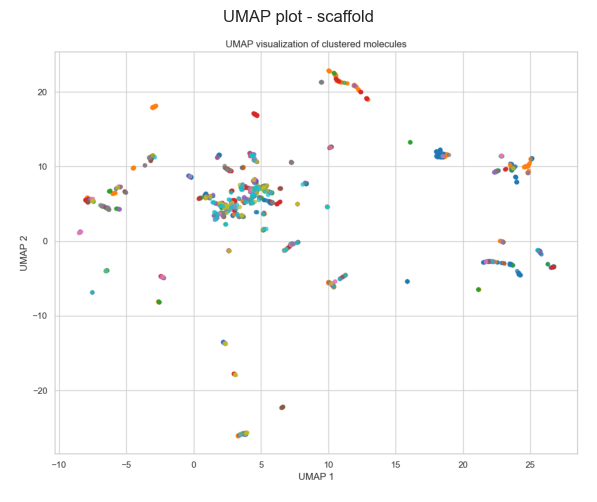


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2879
adjusted_rand_score: 0.0568
mutual_info_score: 5.5729
normalized_mutual_info_score: 0.8565
homogeneity_score: 0.8836
completeness_score: 0.8310
v_measure_score: 0.8565


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.2879
t-SNE plot saved to TSNE_plots/tsne_α1A_jarvis-patrick.png


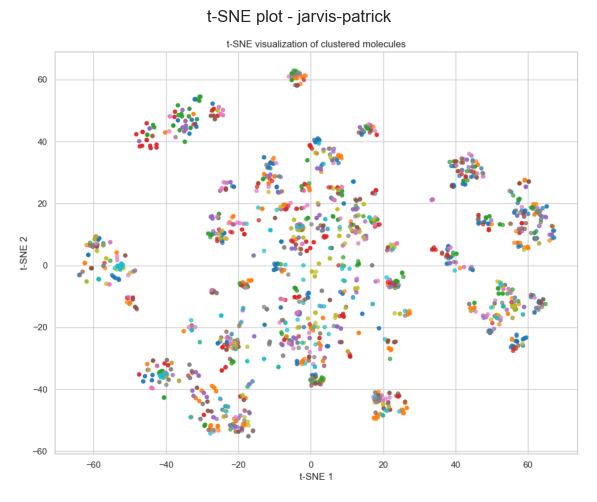

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_α1A_jarvis-patrick.png


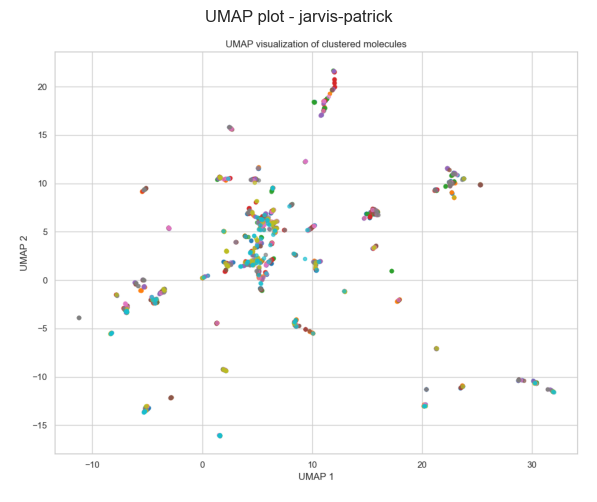


Evaluating clustering with algorithm: kmedoids
silhouette_score: 0.0727
adjusted_rand_score: 0.0060
mutual_info_score: 1.0288
normalized_mutual_info_score: 0.2617
homogeneity_score: 0.1631
completeness_score: 0.6612
v_measure_score: 0.2617


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.0727
t-SNE plot saved to TSNE_plots/tsne_α1A_kmedoids.png


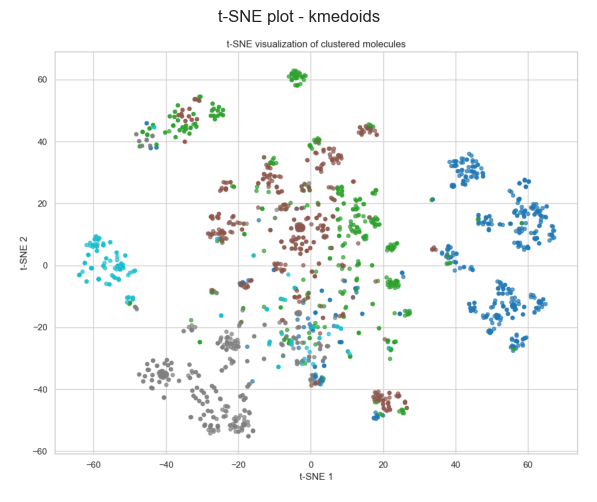

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_α1A_kmedoids.png


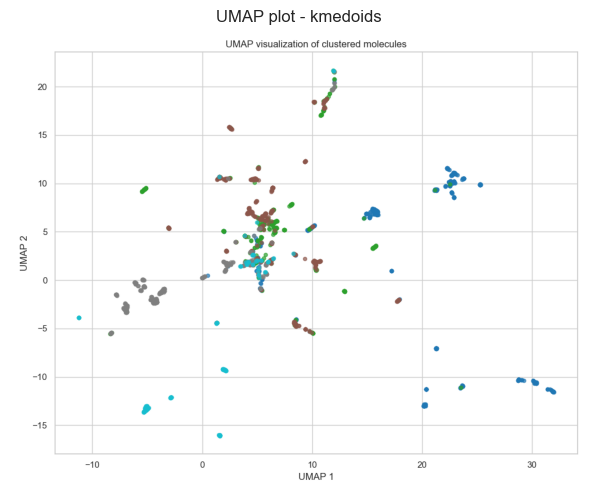


Evaluating clustering with algorithm: maxmin
silhouette_score: 0.0246
adjusted_rand_score: 0.0017
mutual_info_score: 0.6164
normalized_mutual_info_score: 0.1691
homogeneity_score: 0.0977
completeness_score: 0.6271
v_measure_score: 0.1691


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.0246
t-SNE plot saved to TSNE_plots/tsne_α1A_maxmin.png


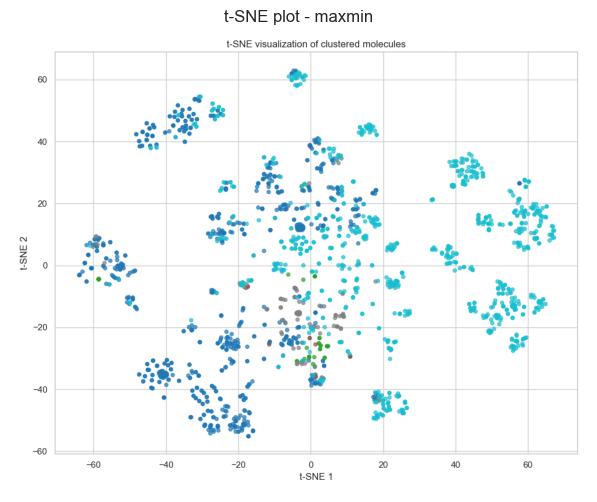

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_α1A_maxmin.png


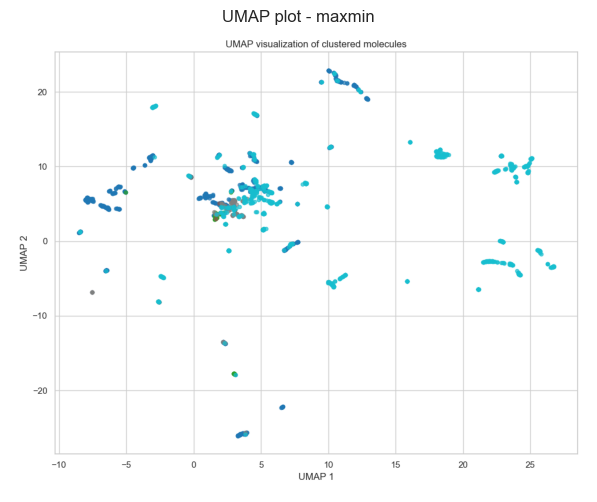


Evaluating clustering with algorithm: butina
silhouette_score: 0.3012
adjusted_rand_score: 0.0589
mutual_info_score: 4.5277
normalized_mutual_info_score: 0.7656
homogeneity_score: 0.7179
completeness_score: 0.8201
v_measure_score: 0.7656


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.3012
t-SNE plot saved to TSNE_plots/tsne_α1A_butina.png


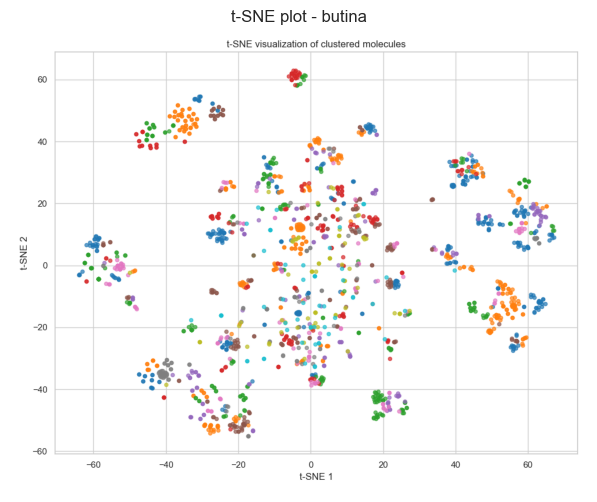

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_α1A_butina.png


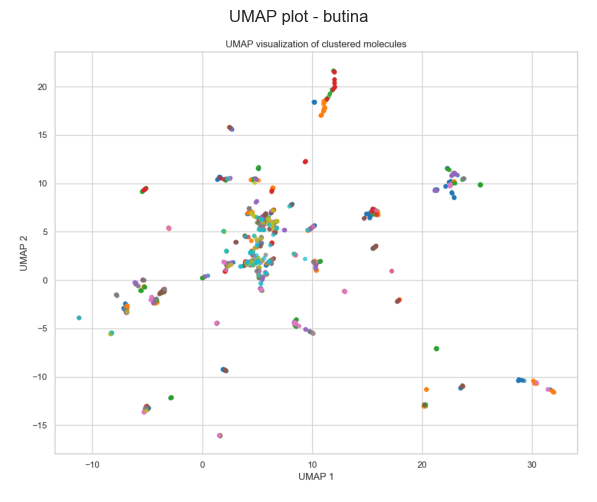


Evaluating clustering with algorithm: birch
silhouette_score: 0.0893
adjusted_rand_score: 0.0070
mutual_info_score: 1.0222
normalized_mutual_info_score: 0.2634
homogeneity_score: 0.1621
completeness_score: 0.7025
v_measure_score: 0.2634


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.0893
t-SNE plot saved to TSNE_plots/tsne_α1A_birch.png


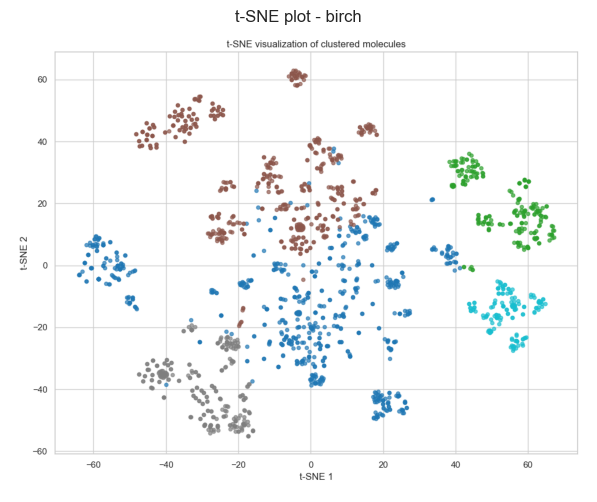

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_α1A_birch.png


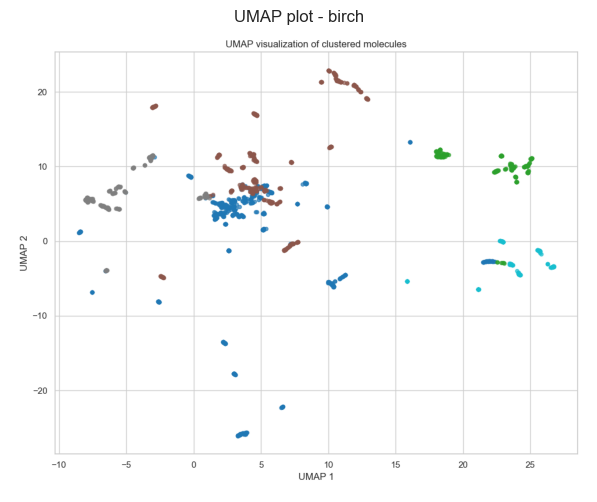


=== Processing dataset: data/cleaned_data/α2A.csv ===
Running clustering: scaffold
Running clustering: jarvis-patrick
Running clustering: kmedoids


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:329: UserWarning: Cluster 2 is empty! self.labels_[self.medoid_indices_[2]] may not be labeled with its corresponding cluster (2).
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:329: UserWarning: Cluster 3 is empty! self.labels_[self.medoid_indices_[3]] may not be labeled with its corresponding cluster (3).
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:329: UserWarning: Cluster 1 is empty! self.labels_[self.medoid_indices_[1]] may not be labeled with its corresponding cluster (1).
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn_extra/cluster/_k_medoids.py:297: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  

Running clustering: maxmin
Running clustering: butina
Running clustering: birch

Evaluating clustering with algorithm: scaffold
silhouette_score: 0.0915
adjusted_rand_score: 0.0261
mutual_info_score: 5.0537
normalized_mutual_info_score: 0.7461
homogeneity_score: 0.7479
completeness_score: 0.7443


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

v_measure_score: 0.7461
silhouette_score: 0.0915
t-SNE plot saved to TSNE_plots/tsne_α2A_scaffold.png


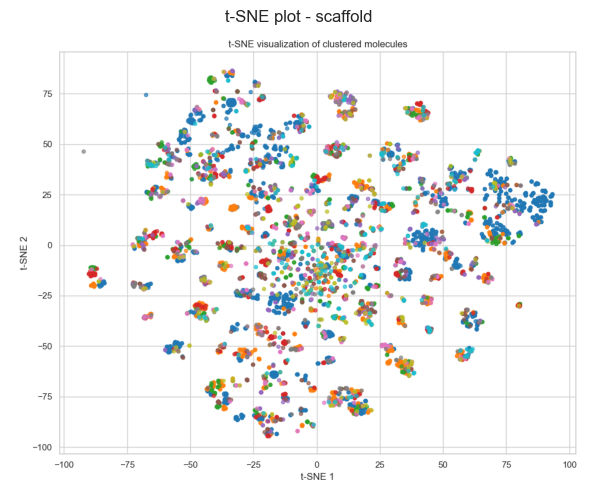

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_α2A_scaffold.png


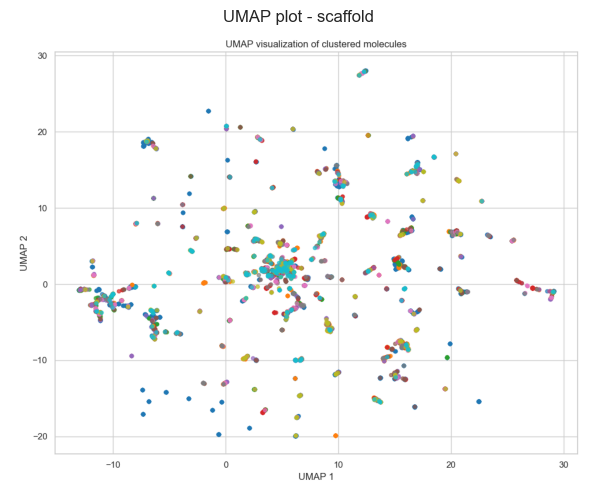


Evaluating clustering with algorithm: jarvis-patrick
silhouette_score: 0.2056
adjusted_rand_score: 0.0127
mutual_info_score: 6.1694
normalized_mutual_info_score: 0.8303
homogeneity_score: 0.9131
completeness_score: 0.7613
v_measure_score: 0.8303


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.2056
t-SNE plot saved to TSNE_plots/tsne_α2A_jarvis-patrick.png


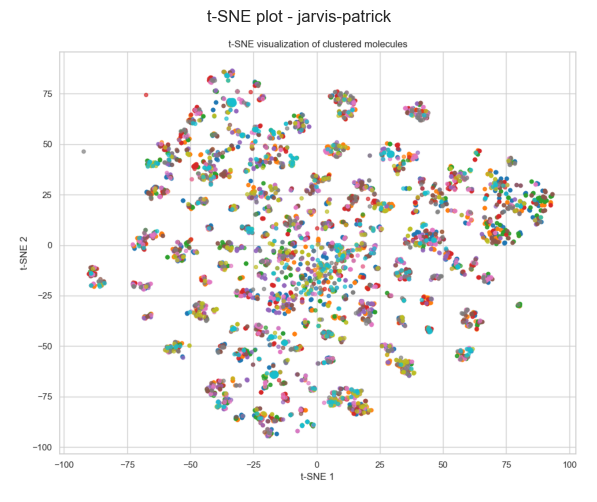

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_α2A_jarvis-patrick.png


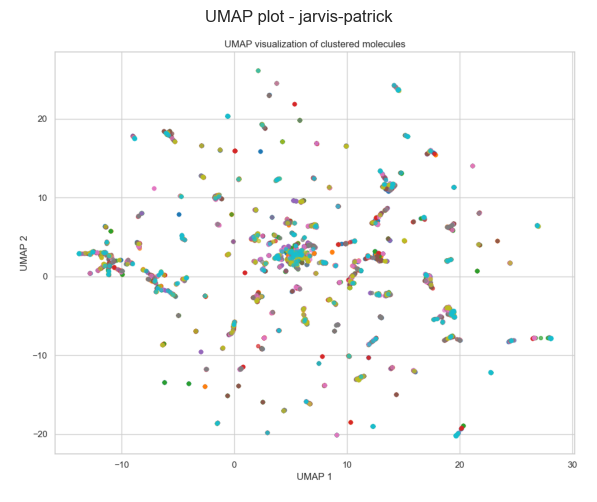


Evaluating clustering with algorithm: kmedoids
silhouette_score: -0.0423
adjusted_rand_score: 0.0025
mutual_info_score: 0.2629
normalized_mutual_info_score: 0.0707
homogeneity_score: 0.0389
completeness_score: 0.3857
v_measure_score: 0.0707


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: -0.0423
t-SNE plot saved to TSNE_plots/tsne_α2A_kmedoids.png


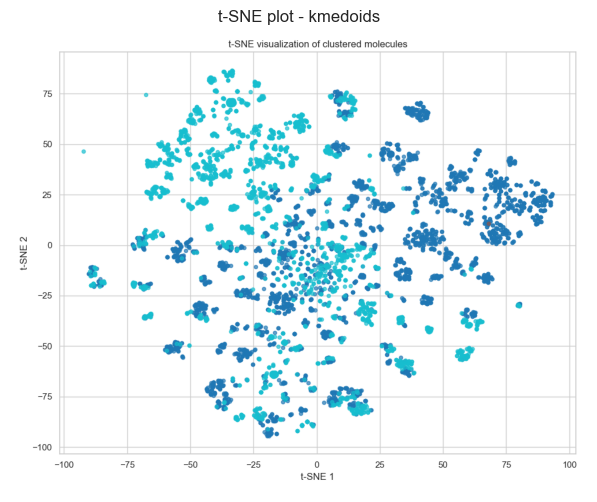

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_α2A_kmedoids.png


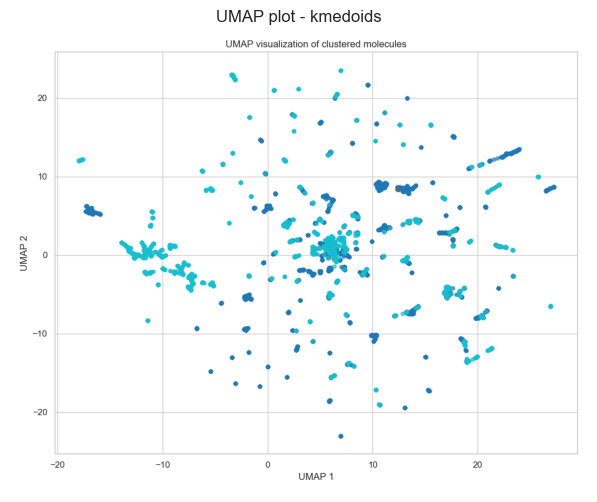


Evaluating clustering with algorithm: maxmin
silhouette_score: -0.0375
adjusted_rand_score: -0.0010
mutual_info_score: 0.3965
normalized_mutual_info_score: 0.1051
homogeneity_score: 0.0587
completeness_score: 0.5045
v_measure_score: 0.1051


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: -0.0375
t-SNE plot saved to TSNE_plots/tsne_α2A_maxmin.png


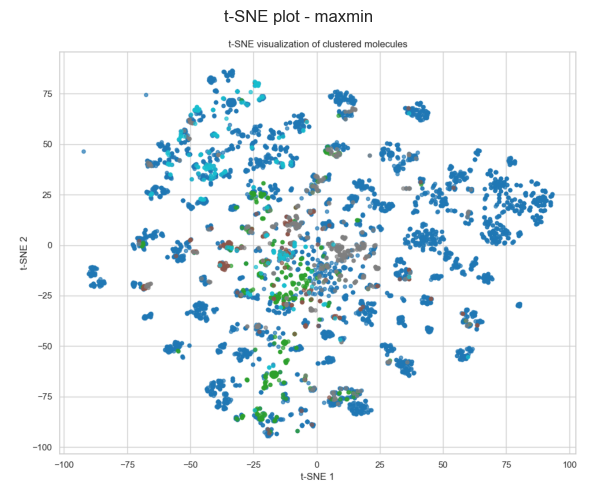

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_α2A_maxmin.png


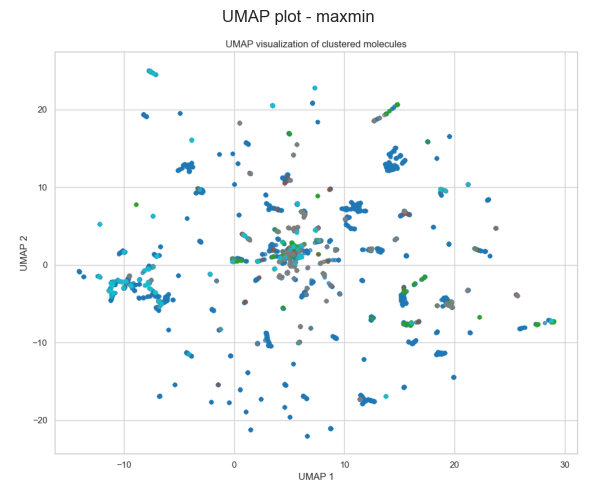


Evaluating clustering with algorithm: butina
silhouette_score: 0.2142
adjusted_rand_score: 0.0303
mutual_info_score: 4.8896
normalized_mutual_info_score: 0.7318
homogeneity_score: 0.7236
completeness_score: 0.7402
v_measure_score: 0.7318


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.2142
t-SNE plot saved to TSNE_plots/tsne_α2A_butina.png


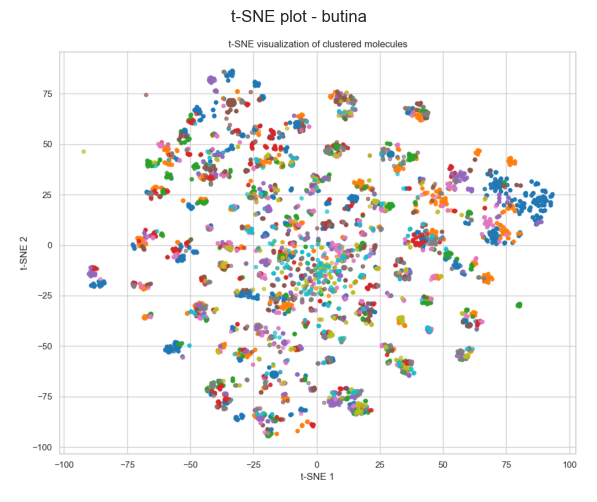

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_α2A_butina.png


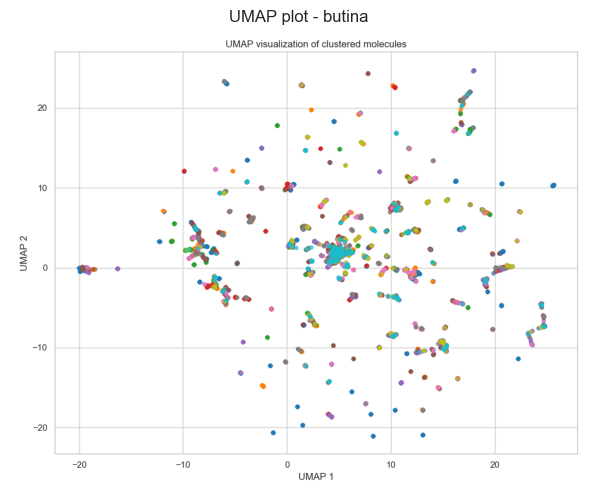


Evaluating clustering with algorithm: birch
silhouette_score: 0.0820
adjusted_rand_score: 0.0088
mutual_info_score: 0.7995
normalized_mutual_info_score: 0.1960
homogeneity_score: 0.1183
completeness_score: 0.5708
v_measure_score: 0.1960


/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/metrics/cluster/_supervised.py:59: UserWarning: Clustering metrics expects discrete valu

silhouette_score: 0.0820
t-SNE plot saved to TSNE_plots/tsne_α2A_birch.png


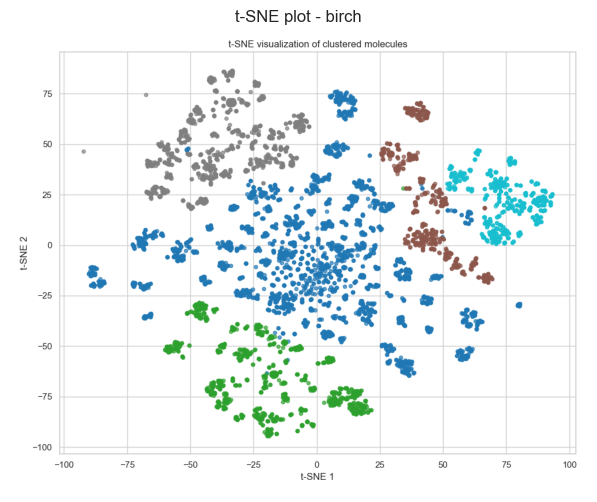

/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/kacpermarzol/miniconda3/envs/mldd2/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP plot saved to UMAP_plots/umap_α2A_birch.png


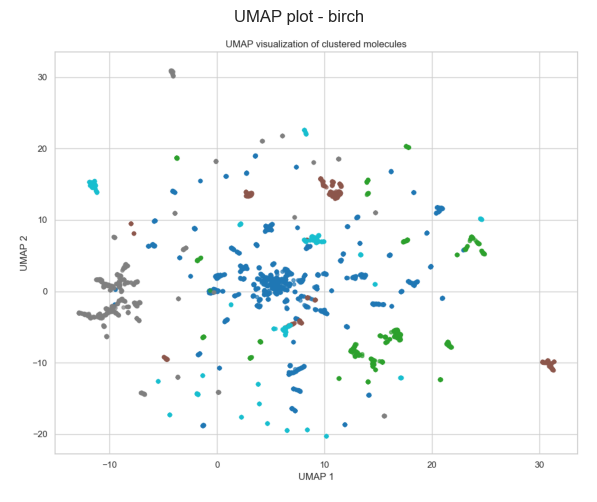

In [13]:
os.makedirs("TSNE_plots", exist_ok=True)
os.makedirs("UMAP_plots", exist_ok=True)

metrics = [
    "silhouette_score", "adjusted_rand_score", "mutual_info_score",
    "normalized_mutual_info_score", "homogeneity_score",
    "completeness_score", "v_measure_score"
]

evaluation_results = []  # Collect results for all datasets and algorithms

for dataset_path in dataset_files:
    print(f"\n=== Processing dataset: {dataset_path} ===")
    smiles, true_labels = load_smiles_and_labels(dataset_path)

    all_cluster_labels = run_clustering(
        smiles_list=smiles,
        clusterer_names=None,
        n_clusters=5,
        fp_type="morgan",
        random_state=42,
        neighbor_k=5,
        min_shared=3
    )

    transformer = FingerprintTransformer(fp_type="morgan", n_bits=2048)
    features = transformer.fit_transform(smiles)

    for algo_name, labels in all_cluster_labels.items():
        if labels is None:
            print(f"Skipping evaluation and plots for {algo_name} due to failure.")
            continue

        print(f"\nEvaluating clustering with algorithm: {algo_name}")
        for metric_name in metrics + ["silhouette_score"]:
            try:
                score = evaluate_clustering(
                    dataset_path,
                    labels,
                    metric=metric_name,
                    feature_matrix=features  # Only used for silhouette
                )
                print(f"{metric_name}: {score:.4f}")
                evaluation_results.append({
                    "Dataset": os.path.basename(dataset_path),
                    "Algorithm": algo_name,
                    "Metric": metric_name,
                    "Score": score
                })
            except Exception as e:
                print(f"Error computing {metric_name} for {algo_name}: {e}")


        try:
            tsne_save_path = f"TSNE_plots/tsne_{os.path.basename(dataset_path).replace('.csv','')}_{algo_name}.png"
            create_tsne.generate_tsne(dataset_path, labels, save_path=tsne_save_path)
            img = plt.imread(tsne_save_path)
            plt.figure(figsize=(8,6))
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"t-SNE plot - {algo_name}")
            plt.show()
        except Exception as e:
            print(f"Failed to generate t-SNE for {algo_name}: {e}")

        try:
            umap_save_path = f"UMAP_plots/umap_{os.path.basename(dataset_path).replace('.csv','')}_{algo_name}.png"
            create_umap.generate_umap(dataset_path, labels, save_path=umap_save_path)
            img = plt.imread(umap_save_path)
            plt.figure(figsize=(8,6))
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"UMAP plot - {algo_name}")
            plt.show()
        except Exception as e:
            print(f"Failed to generate UMAP for {algo_name}: {e}")


# 5. Prepare results

In [15]:
results_df = pd.DataFrame(evaluation_results)

pivot_table = results_df.pivot_table(
    index=["Dataset", "Algorithm"],
    columns="Metric",
    values="Score"
)

pivot_table.head()


Metric                     adjusted_rand_score  completeness_score  \
Dataset    Algorithm                                                 
5-HT1A.csv birch                      0.001873            0.558662   
           butina                     0.032339            0.785052   
           jarvis-patrick             0.018272            0.803358   
           kmedoids                   0.000550            0.463661   
           maxmin                     0.000042            0.476390   

Metric                     homogeneity_score  mutual_info_score  \
Dataset    Algorithm                                              
5-HT1A.csv birch                    0.099511           0.699307   
           butina                   0.743338           5.223735   
           jarvis-patrick           0.902258           6.340529   
           kmedoids                 0.072339           0.508356   
           maxmin                   0.075479           0.530422   

Metric                     normalized_mutual_info_score  silhouette_score  \
Dataset    Algorithm                                                        
5-HT1A.csv birch                               0.168932          0.053534   
           butina                              0.763626          0.269867   
           jarvis-patrick                      0.849941          0.226925   
           kmedoids                            0.125152         -0.106158   
           maxmin                              0.130312         -0.011907   

Metric                     v_measure_score  
Dataset    Algorithm                        
5-HT1A.csv birch                  0.168932  
           butina                 0.763626  
           jarvis-patrick         0.849941  
           kmedoids               0.125152  
           maxmin                 0.130312

# 6. Visualize Results as Heatmap

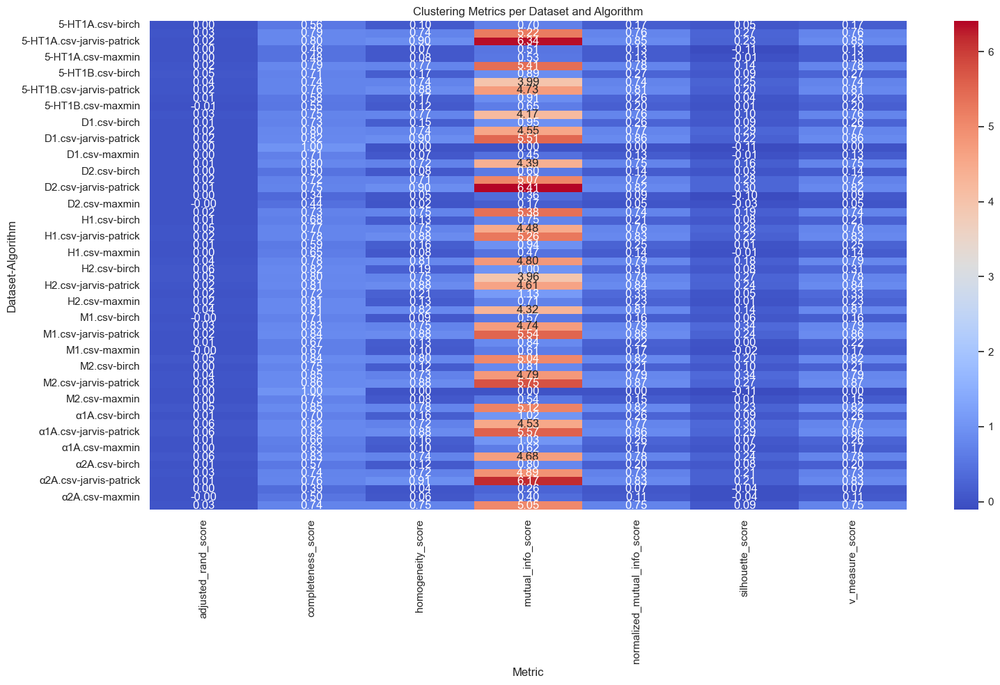

In [16]:
plt.figure(figsize=(16, 10))
sns.heatmap(pivot_table, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Clustering Metrics per Dataset and Algorithm")
plt.tight_layout()
plt.show()


7. # t-SNE & UMAP plots

In [18]:
# os.makedirs("plots", exist_ok=True)
#
# for dataset_path in dataset_files:
#     name = os.path.basename(dataset_path).replace(".csv", "")
#     smiles, _ = load_smiles_and_labels(dataset_path)
#     features = smiles_to_fingerprints(smiles)
#
#     try:
#         labels = KMeans(n_clusters=5, random_state=42).fit_predict(features)
#     except Exception as e:
#         print(f"Failed to cluster {name} with KMeans: {e}")
#         continue
#
#     print(f"Generating plots for {name}...")
#
#     try:
#         tsne_path = f"plots/{name}_tsne.png"
#         create_tsne.generate_tsne(dataset_path, labels=labels, save_path=tsne_path, metrics_info="KMeans Clustering")
#         img = plt.imread(tsne_path)
#         plt.figure(figsize=(8, 6))
#         plt.imshow(img)
#         plt.axis('off')
#         plt.title(f"t-SNE - {name}")
#         plt.show()
#     except Exception as e:
#         print(f"Failed t-SNE for {name}: {e}")
#
#     try:
#         umap_path = f"plots/{name}_umap.png"
#         create_umap.generate_umap(dataset_path, labels=labels, save_path=umap_path, metrics_info="KMeans Clustering")
#         img = plt.imread(umap_path)
#         plt.figure(figsize=(8, 6))
#         plt.imshow(img)
#         plt.axis('off')
#         plt.title(f"UMAP - {name}")
#         plt.show()
#     except Exception as e:
#         print(f"Failed UMAP for {name}: {e}")


# 8. Summary

In [21]:
summary_table = results_df.groupby(["Algorithm", "Metric"])["Score"].mean().unstack().round(3)

print("Average Scores per Algorithm:")
display(summary_table)

summary_table.to_csv("clustering_summary.csv")

Average Scores per Algorithm:


Metric,adjusted_rand_score,completeness_score,homogeneity_score,mutual_info_score,normalized_mutual_info_score,silhouette_score,v_measure_score
Algorithm,,,,,,,
birch,0.016,0.673,0.131,0.809,0.219,0.074,0.219
butina,0.035,0.787,0.736,4.621,0.760,0.283,0.760
jarvis-patrick,0.023,0.801,0.889,5.591,0.842,0.242,0.842
kmedoids,0.005,0.641,0.100,0.598,0.161,-0.029,0.161
maxmin,0.002,0.616,0.084,0.514,0.147,-0.005,0.147
scaffold,0.034,0.792,0.771,4.835,0.781,0.167,0.781
